In [1]:
import glob
import zlib
import copy
import pickle
import _pickle as cpickle
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from scipy.ndimage.filters import gaussian_filter
from tensorly.decomposition import non_negative_parafac as nnp

In [2]:
with open('minimal_hdx_tensors.pickle.zlib', 'rb') as file:
    df_dict, alldata= pickle.loads(zlib.decompress(file.read()))
df = pd.DataFrame.from_dict(df_dict)

alldata = [alldata[1], alldata[0]] + alldata[2:] #fix issue with order of data in pickle file

hd_mass_diff = 1.006277
c13_mass_diff = 1.00335
total_isotopes = 50
ppm_radius = 30
est_peak_gaps = [0] + list(np.linspace(c13_mass_diff, hd_mass_diff, 7)) + [hd_mass_diff for x in range(total_isotopes - 8)]
cum_peak_gaps = np.cumsum(est_peak_gaps)

In [3]:
def sparse_to_full_tensor(data):
    retention_labels, drift_labels, sparse_data = data
    
    min_mz = min([min(x[:,0]) for x in sparse_data])
    max_mz = max([max(x[:,0]) for x in sparse_data])
    mz_labels = np.arange(min_mz, max_mz + 0.002, 0.002)
    
    tensor3_out = np.zeros((len(retention_labels), len(drift_labels), len(mz_labels)))
    
    scan = 0
    for i in range(len(retention_labels)):
        for j in range(len(drift_labels)):
            mz_indices = np.searchsorted(mz_labels, sparse_data[scan][:,0])
            tensor3_out[i][j][mz_indices] = sparse_data[scan][:,1]
            scan += 1
    return (retention_labels, drift_labels, mz_labels, tensor3_out)

def tensor_plot(retention_labels, drift_labels, mz_labels, tensor3, expected_peak_locations=False, title="No Title"):
    #this plot integrates over all mz values (axis 2) to show the total mass intensity 
    fig = plt.figure(figsize=(20,6))
    plt.suptitle(title)
    gs = gridspec.GridSpec(ncols=4, nrows=1, figure=fig)
    ax1 = fig.add_subplot(gs[0, 0])
    sns.heatmap(np.sum(tensor3,axis=2),cbar=False, ax=ax1)
    plt.xlabel('drift time bin (axis 1)')
    plt.ylabel('retention time bin (axis 0)')
    
    ax2 = fig.add_subplot(gs[0, 1:])
    plt.plot(mz_labels, np.sum(tensor3, axis=(0,1)))
    plt.xlim([min(mz_labels), max(mz_labels)])
    ax2.set_yticks([])
    plt.xlabel('mz (axis 2)')
    
    ylim = ax2.get_ylim()
    if expected_peak_locations:

        for lowlim, highlim in expected_peak_locations:
            ax2.fill_between([lowlim, highlim], ylim[0], ylim[1],color='red',alpha=0.2)
    ax2.set_ylim([0, ylim[1]])
    plt.show()
    plt.close()
    
def factorize_and_plot(index, n_factors, title, filter_dims=(3,1,0),step=1):
    data=alldata[index]
    
    #draw a big title
    plt.figure(figsize=(20,0.5))
    ax=plt.subplot(111)
    plt.suptitle(title,fontsize=30)
    plt.plot([0,1],[0,0],linewidth=0)
    ax.set_xticks([])
    ax.set_yticks([])
    sns.despine()
    plt.show()
    plt.close()
    
    #calculate expected peak locations to draw the red bars
    hd_mass_diff = 1.006277
    c13_mass_diff = 1.00335
    total_isotopes = 50
    ppm_radius = 30
    est_peak_gaps = [0] + list(np.linspace(c13_mass_diff, hd_mass_diff, 7)) + [hd_mass_diff for x in range(total_isotopes - 8)]
    cum_peak_gaps = np.cumsum(est_peak_gaps)
    mz_centers = df['obs_mz'].values[index] + (cum_peak_gaps / df['charge'].values[index])
    mz_centers = mz_centers[0:10]
    low_lims = mz_centers * ((1000000.0 - ppm_radius)/1000000.0)
    high_lims = mz_centers * ((1000000.0 + ppm_radius)/1000000.0)
    expected_peak_locations = list(zip(low_lims, high_lims))
    
    
    #show raw data
    retention_labels, drift_labels, mz_labels, tensor3 = sparse_to_full_tensor(data)
    #tensor3=tensor3[:,:,::step]
    print (np.shape(tensor3))
    print (np.shape(tensor3[:,:,0:-(np.shape(tensor3)[-1] % step)]))
    if np.shape(tensor3)[-1] % step > 0: tensor3 = tensor3[:,:,0:-(np.shape(tensor3)[-1] % step)]
    else: t3buff = tensor3[:,:,::step]
        
    tensor3 = tensor3.reshape(len(retention_labels),len(drift_labels),int(len(mz_labels)/step),step)
    print (np.shape(tensor3))
    tensor3 = np.sum(tensor3, axis = 3)
    print (np.shape(tensor3))
    
    mz_labels=mz_labels[::step][0:np.shape(tensor3)[-1]]
    tensor_plot(retention_labels, drift_labels, mz_labels, tensor3, expected_peak_locations, f'Raw data - overall dimension {np.shape(tensor3)}')
    
    #Gaussian filter raw data
    filtered_tensor3 = gaussian_filter(tensor3,filter_dims)
    tensor_plot(retention_labels, drift_labels, mz_labels, filtered_tensor3, expected_peak_locations, f'Gaussian filtered data - overall dimension {np.shape(filtered_tensor3)}')
    
    #factorize and show each factor
    factors = nnp(filtered_tensor3, n_factors)
    total_factor_masses=[]
    for i in range(n_factors):
        factor_reconstruction = np.multiply.outer(np.multiply.outer(factors[1][0][:,i], factors[1][1][:,i]), factors[1][2][:,i])
        total_factor_masses.append(np.sum(factor_reconstruction))
        tensor_plot(retention_labels, drift_labels, mz_labels, factor_reconstruction, expected_peak_locations, f'Factor {i}'+title)
    
    #show the retention and drift dimensions of all factors side-by-side
    fig = plt.figure(figsize=(20,6))
    plt.subplot(131)
    sns.heatmap(factors[1][0],cbar=False)
    plt.xlabel('Factor index')
    plt.ylabel('Retention time bin')
    
    plt.subplot(132)
    sns.heatmap(factors[1][1],cbar=False)
    plt.xlabel('Factor index')
    plt.ylabel('Drift time bin')
    
    #plot the overall mass of each factor
    plt.subplot(133)
    plt.bar(range(n_factors), total_factor_masses/sum(total_factor_masses))
    plt.xlabel('Factor index')
    plt.ylabel('Relative factor mass')
    
    fig = plt.figure(figsize=(20,6))
    plt.subplot(131)
    sns.heatmap(np.corrcoef(factors[1][0].T),vmin=0,vmax=1,annot=True)
    
    plt.subplot(132)
    sns.heatmap(np.corrcoef(factors[1][1].T),vmin=0,vmax=1,annot=True)

    #plot the overall mass of each factor
    plt.subplot(133)
    sns.heatmap(np.corrcoef(factors[1][2].T),vmin=0,vmax=1,annot=True)
    plt.show()
    plt.close()
    
    fig = plt.figure(figsize=(20,7))
    plt.subplot(121)
    sns.heatmap(np.minimum(np.corrcoef(factors[1][0].T),np.corrcoef(factors[1][1].T)),vmin=0,vmax=1,annot=True)
    
    plt.subplot(122)
    sns.heatmap(np.minimum(np.minimum(np.corrcoef(factors[1][0].T),np.corrcoef(factors[1][1].T)),np.corrcoef(factors[1][2].T)),vmin=0,vmax=1,annot=True)
    plt.show()
    plt.close()

In [4]:
#this contains information about the proteins- not relevant to understand the structure of the data
df

,Unnamed: 0,name,RT,im_mono,ab_cluster_total,MW,charge,expect_mz,obs_mz,ppm,...,rt_group_mean_RT_11_0,rt_group_mean_RT_12_0,rt_group_mean_RT_13_0,rt_group_mean_RT_14_0,rt_group_mean_RT_15_0,rt_group_mean_RT_16_0,rt_group_mean_RT_17_0,rt_group_mean_RT_18_0,rt_group_mean_RT_19_0,rt_group_mean_RT_20_0
1484,1484,EEHEE_rd4_0187.pdb_8.89948,9.094758,84.878418,507261.5,5692.873643,7.0,814.274933,814.275133,0.2,...,8.814801,8.831737,8.848673,8.730120,8.730120,8.730120,8.848673,8.899482,8.696248,8.882546
98,98,HEEH_rd2_0093.pdb_5.91308,6.010894,77.141570,157256.3,5683.836083,8.0,711.486780,711.487364,0.8,...,5.828397,5.879206,5.896142,5.743717,5.743717,5.760653,5.879206,5.930014,5.726780,5.930014
1531,1531,HHH_rd4_0611.pdb_8.98868,9.190873,84.832634,577182.2,5645.095148,7.0,807.449434,807.448422,-1.3,...,8.903998,8.920934,8.937870,8.819317,8.819317,8.819317,8.937870,8.988679,8.785445,8.971743
1861,1862,HEEH_rd4_0347.pdb_9.75758,9.768992,103.227769,122271.8,5920.148029,6.0,987.698608,987.695290,-3.4,...,9.672898,9.672898,9.672898,9.588218,9.588218,9.571281,9.706770,9.757579,9.554345,9.723707
2417,2417,EEHEE_rd4_0481.pdb_11.64596,11.904881,86.456785,169806.2,5368.650977,7.0,767.957410,767.955096,-3.0,...,11.535872,11.535872,11.552808,11.468128,11.434255,11.434255,11.586681,11.637489,11.434255,11.603617
3978,3972,HEEH_rd3_0223.pdb_16.61671,16.859607,131.063185,234062.3,5099.721667,5.0,1020.951603,1020.950188,-1.4,...,16.515094,16.642115,16.633647,16.413477,16.447349,16.464285,16.565902,16.582838,16.413477,16.616711
3979,3990,HEEH_rd3_0223.pdb_16.61671,16.885650,81.484740,101405.5,5099.721667,7.0,729.538937,729.537093,-2.5,...,16.515094,16.642115,16.633647,16.413477,16.447349,16.464285,16.565902,16.582838,16.413477,16.616711


In [5]:
def corr_check(factors, cutoff):
    #Checks scipy non_negatve_parafac output factors for inter-factor (off-diagonal) correlations > cutoff, returns True if all values are < cutoff
    def check(a):
        if any(a[np.where(~np.eye(a.shape[0],dtype=bool))] > cutoff):
            return False
        else:
            return True
    
    for i in range(3):
        if not check(np.corrcoef(factors[1][i].T)):
            return False
    return True

In [9]:
np.minimum(np.minimum(np.corrcoef(factors[1][0].T),np.corrcoef(factors[1][1].T)),np.corrcoef(factors[1][2].T))

array([[ 1.      , -0.889114],
       [-0.889114,  1.      ]])

In [6]:
#Finds highest n_factors satisfying inter-factor correlation check. Counting down n_factors for all tensors in alldata, for a series of correlation ceiling and step values. Plots highest n_factors of each.

for index in [0]:
    
    print("Index: "+str(index))
        
    data = alldata[index]
    print("Original Shape: "+str(len(data[0]))+", "+str(len(data[1]))+", "+str(len(data[2])))
    
    retention_labels, drift_labels, mz_labels, tensor3 = sparse_to_full_tensor(data)
    print("Full Tensor Shape: "+str(np.shape(tensor3)))
    
    for step in np.arange(20, 5, -5):
        
        print("Step: "+str(step))
        
        if np.shape(tensor3)[-1] % step > 0: 
            t3buff = tensor3[:,:,0:-(np.shape(tensor3)[-1] % step)]
            t3buff = t3buff.reshape(len(retention_labels),len(drift_labels),int(len(mz_labels)/step),step)
            t3buff = np.sum(t3buff, axis=3)
            
        print("New Shape with Step = "+str(step)+": "+str(np.shape(t3buff)))
        
        mz_labels = mz_labels[::step][0:np.shape(t3buff)[-1]]
        filtered_tensor3 = gaussian_filter(t3buff,(3,1,0))
        
        nf = 15
        flag = True
        while flag:
            print("Index: "+str(index)+", Step: "+str(step)+", N_Factors: "+str(nf))
            factors = nnp(filtered_tensor3, nf)
            if nf > 1:
                for cutoff in np.arange(0.2, 0.4, 0.025):
                    cutoff = np.round(cutoff, 3) #avoid printing 12 digit value
                    #print("Correlation Ceiling: "+str(cutoff))
                    
                    if corr_check(factors, cutoff):
                        print("Accepted - Index: "+str(index)+", Step: "+str(step)+", N_Factors: "+str(nf)+", at Correlation Ceiling: "+str(cutoff))
                        #total_factor_masses = [np.sum(np.multiply.outer(np.multiply.outer(factors[1][0][:,i], factors[1][1][:,i]), factors[1][2][:,i])) for i in range(len(factors))] #summed intensities of reconstructed factors
                        #factorize_and_plot(index, nf, "alldata["+str(index)+"], Step: "+str(step)+", Correlation Ceiling: "+str(cutoff)+", N_Factors: "+str(nf), step=step)
                        flag = False
                        break
                        
                nf -= 1
                
            else:
                flag = False
                print("All n-factors failed for Index: "+str(index)+", Step: "+str(step))

Index: 0
Original Shape: 47, 9, 423
Full Tensor Shape: (47, 9, 5064)
Step: 20
New Shape with Step = 20: (47, 9, 253)
Index: 0, Step: 20, N_Factors: 15
Index: 0, Step: 20, N_Factors: 14
Index: 0, Step: 20, N_Factors: 13
Index: 0, Step: 20, N_Factors: 12
Index: 0, Step: 20, N_Factors: 11
Index: 0, Step: 20, N_Factors: 10
Index: 0, Step: 20, N_Factors: 9
Index: 0, Step: 20, N_Factors: 8
Index: 0, Step: 20, N_Factors: 7
Index: 0, Step: 20, N_Factors: 6
Index: 0, Step: 20, N_Factors: 5
Index: 0, Step: 20, N_Factors: 4
Index: 0, Step: 20, N_Factors: 3
Index: 0, Step: 20, N_Factors: 2
Accepted - Index: 0, Step: 20, N_Factors: 2, at Correlation Ceiling: 0.35
Step: 15


ValueError: cannot reshape array of size 2138265 into shape (47,9,16,15)

In [12]:
3807000/47/12

6750.0

In [13]:
22*15

330

In [1]:
6750 / 20

337.5

In [2]:
6750 / 15

450.0

In [ ]:
6750 /

In [8]:
step=1
retention_labels, drift_labels, mz_labels, tensor3 = sparse_to_full_tensor(alldata[6])
tensor3=tensor3[:,:,::step]
mz_labels=mz_labels[::step]
filtered_tensor3= gaussian_filter(tensor3,(3,1,0))

In [7]:
%%timeit
nnp(filtered_tensor3, 13)

8.91 s ± 257 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


In [8]:
step=10
retention_labels, drift_labels, mz_labels, tensor3 = sparse_to_full_tensor(alldata[6])
tensor3=tensor3[:,:,::step]
mz_labels=mz_labels[::step]
filtered_tensor3= gaussian_filter(tensor3,(3,1,0))

In [9]:
%%timeit
nnp(filtered_tensor3, 20)

8.82 s ± 238 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


In [10]:
step=3
retention_labels, drift_labels, mz_labels, tensor3 = sparse_to_full_tensor(alldata[0])
tensor3=tensor3[:,:,::step]
mz_labels=mz_labels[::step]
filtered_tensor3= gaussian_filter(tensor3,(3,1,0))

In [11]:
%%timeit
nnp(filtered_tensor3, 8)

868 ms ± 75.3 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


(47, 9, 5064)
(47, 9, 5060)
(47, 9, 506, 10)
(47, 9, 506)


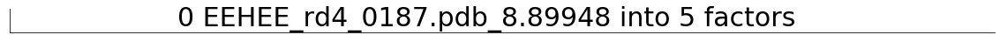

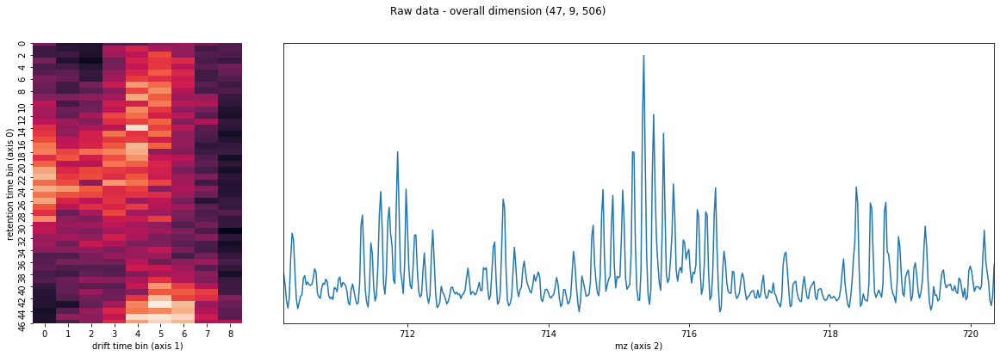

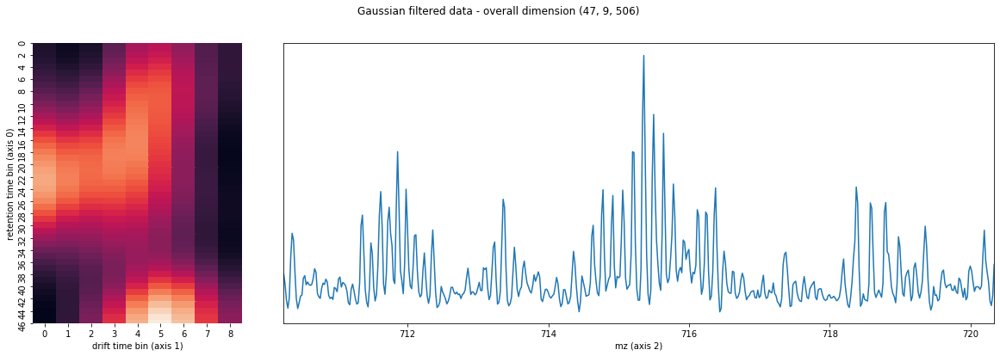

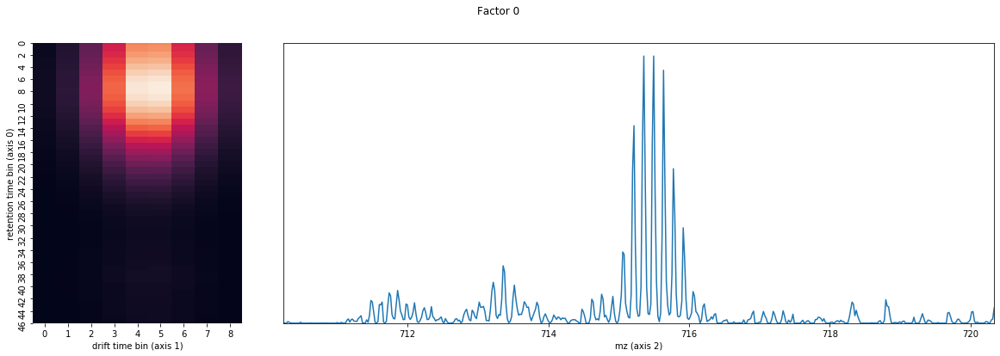

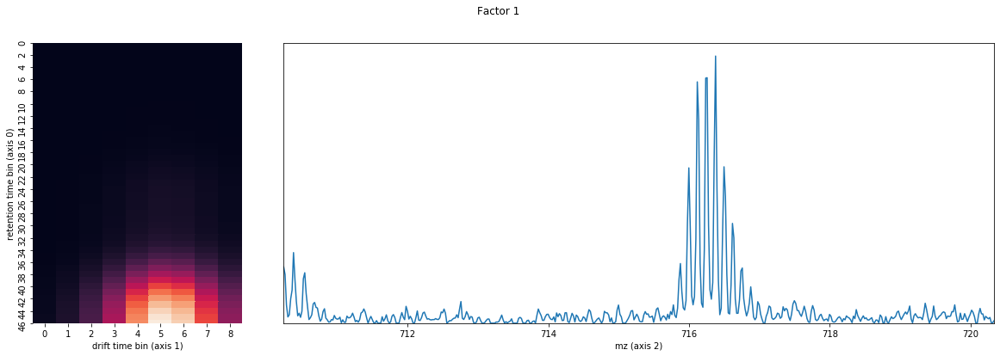

...

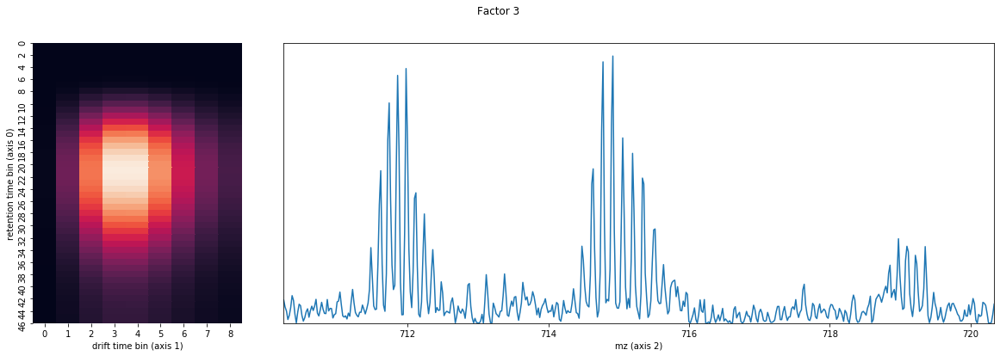

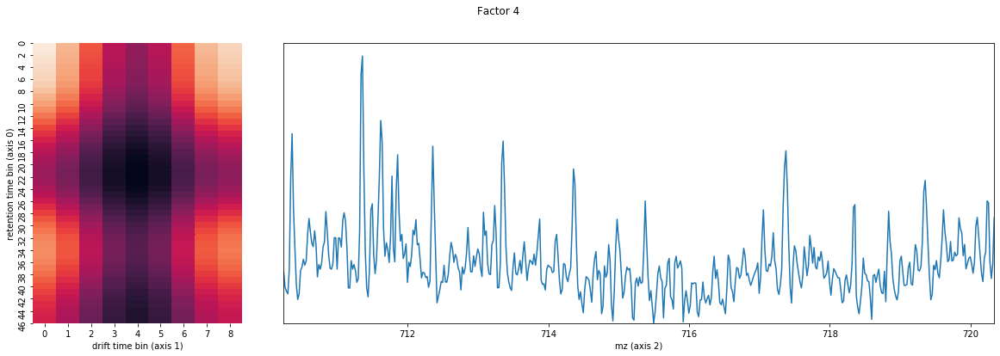

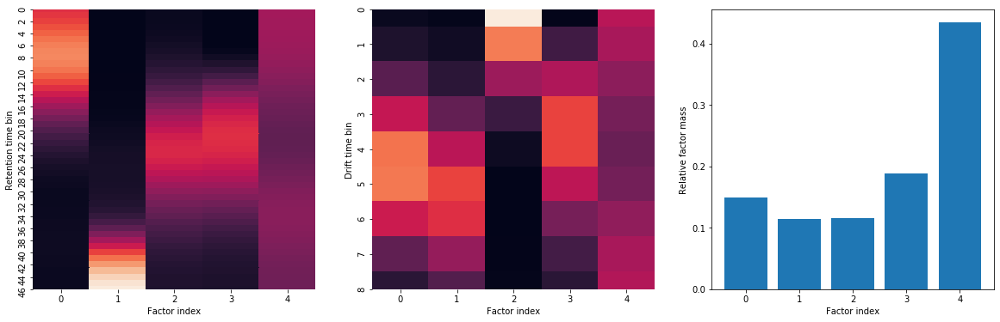

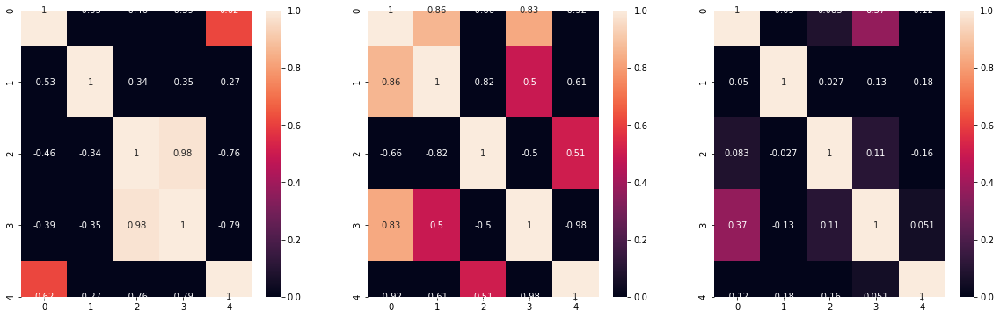

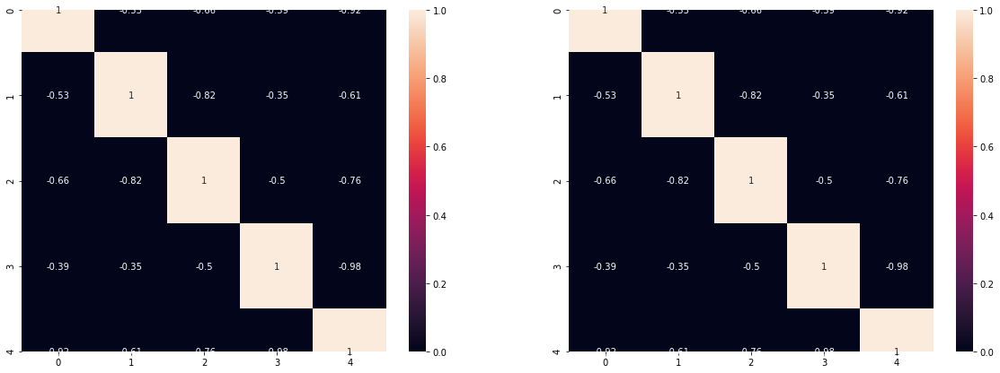

In [13]:
#Our goal is for each factor to be a nice 2D gaussian in dimensions 0 and 1,
#and have a "clean" looking mass spectrum in dimension 2. In particular,
#we expect there to be at least one factor that:
# 1. shows a clean mass spectrum concentrated in the red region,
# 2. peaking in about the 3rd or 4th red bar from the left,
# 3. with very little data outside of the red region.

#in this example it takes at least 5 factors to get the clean peak we
#are looking for, which is factor 3 (counting from 0). Also, factor
#4 seems to be made up of junk (it is not a gaussian in dimensions 1+2)

n_factors = 5
i = 0 #index of protein we are looking at
title = f"{i} {df['name'].values[i]} into {n_factors} factors"
factorize_and_plot(i, n_factors, title, step=10)

(47, 9, 5064)
(47, 9, 5060)
(47, 9, 506, 10)
(47, 9, 506)


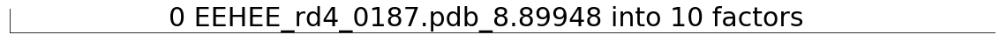

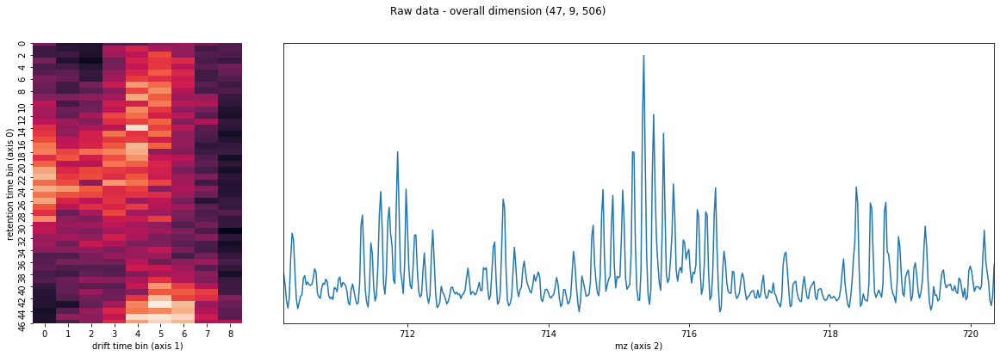

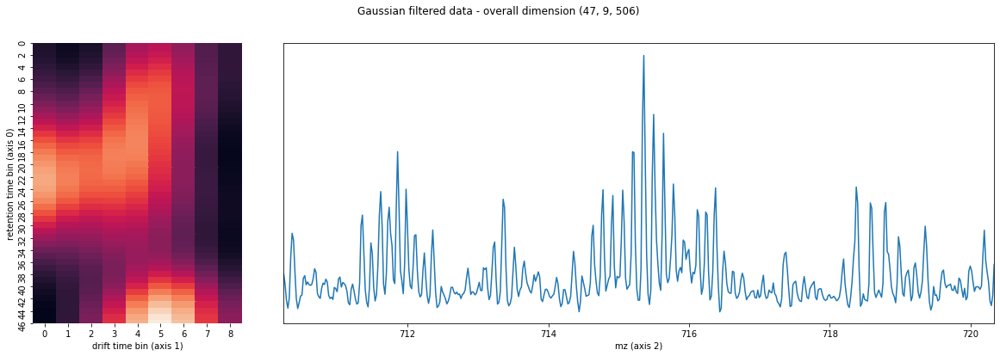

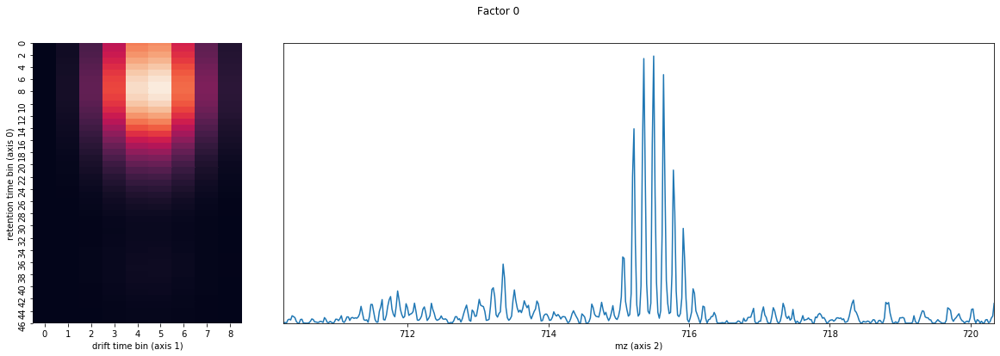

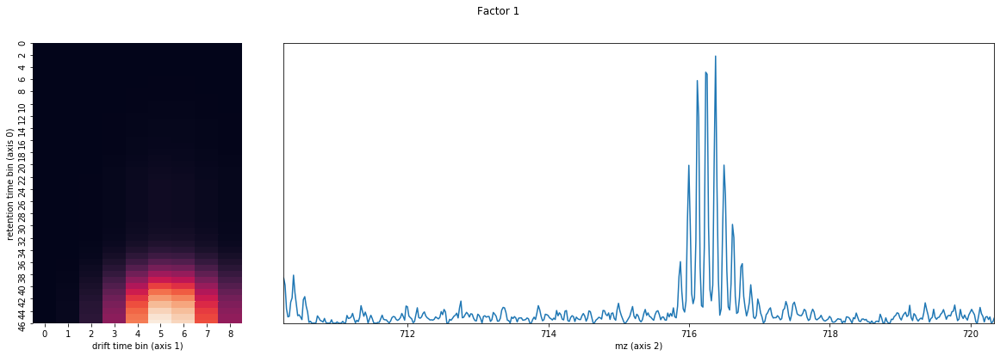

...

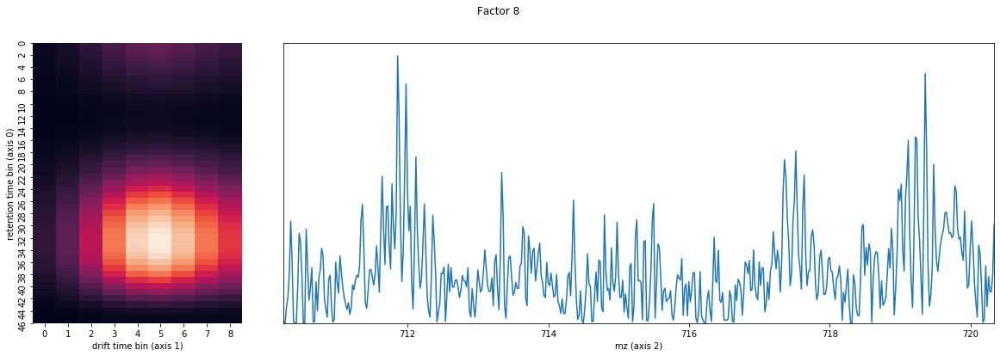

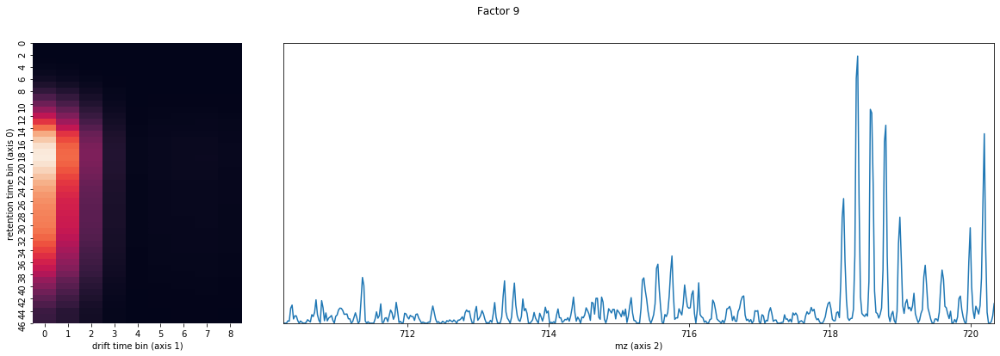

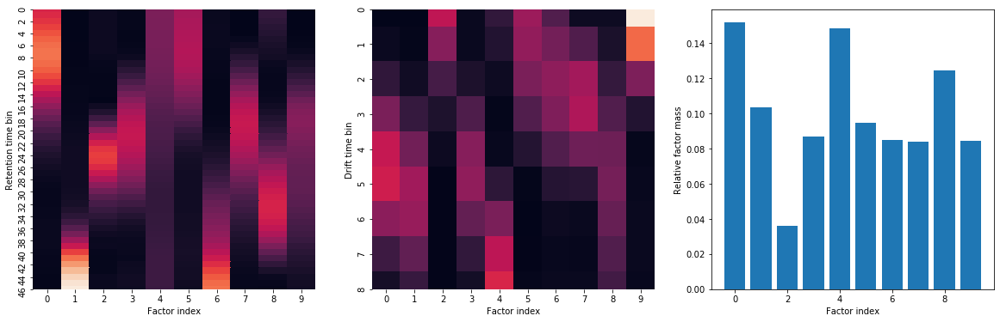

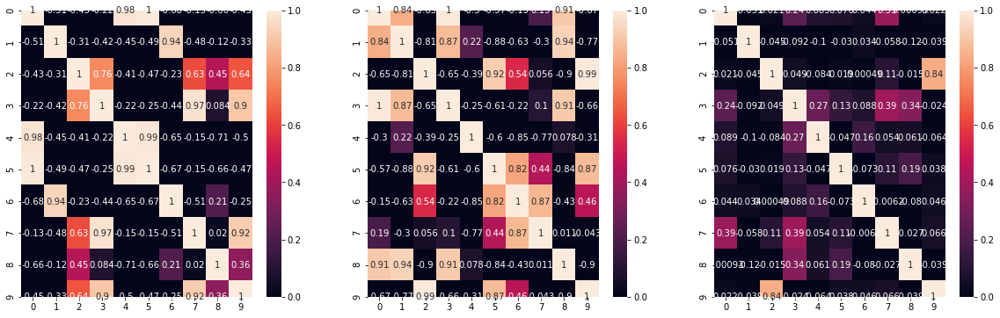

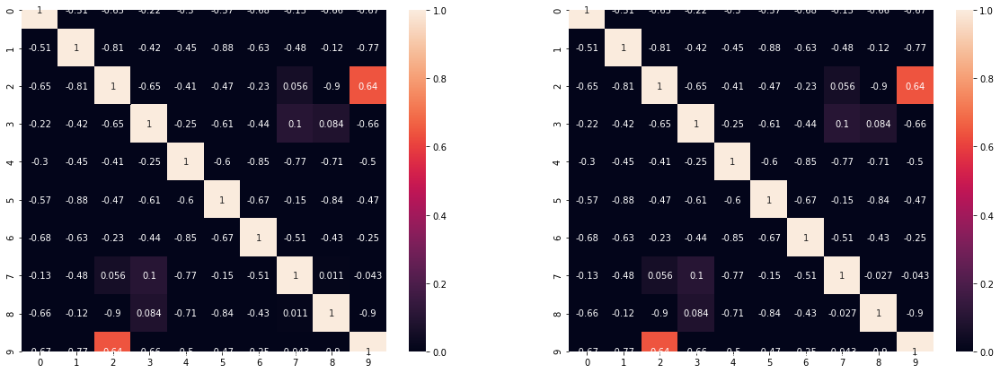

In [14]:
#Our goal is for each factor to be a nice 2D gaussian in dimensions 0 and 1,
#and have a "clean" looking mass spectrum in dimension 2. In particular,
#we expect there to be at least one factor that:
# 1. shows a clean mass spectrum concentrated in the red region,
# 2. peaking in about the 3rd or 4th red bar from the left,
# 3. with very little data outside of the red region.

#in this example it takes at least 5 factors to get the clean peak we
#are looking for, which is factor 3 (counting from 0). Also, factor
#4 seems to be made up of junk (it is not a gaussian in dimensions 1+2)

n_factors = 10
i = 0 #index of protein we are looking at
title = f"{i} {df['name'].values[i]} into {n_factors} factors"
factorize_and_plot(i, n_factors, title, step=10)

(47, 9, 5064)
(47, 9, 5060)
(47, 9, 506, 10)
(47, 9, 506)


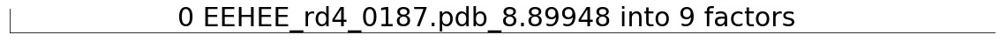

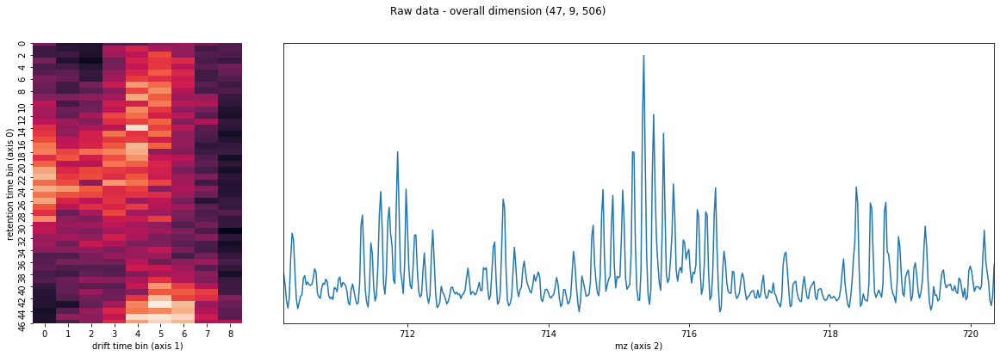

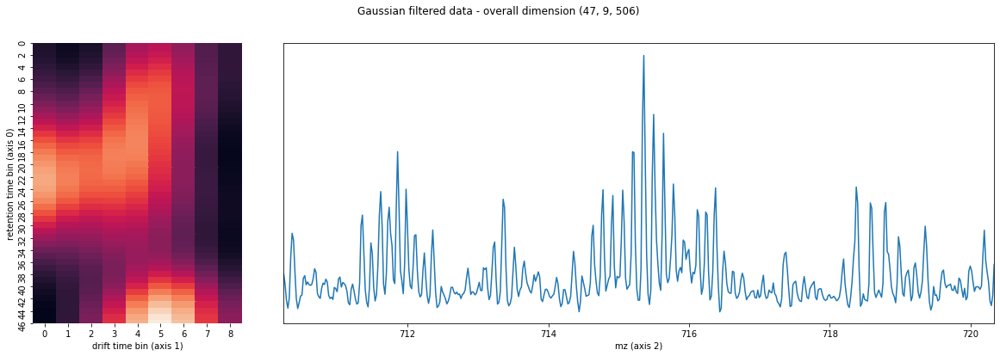

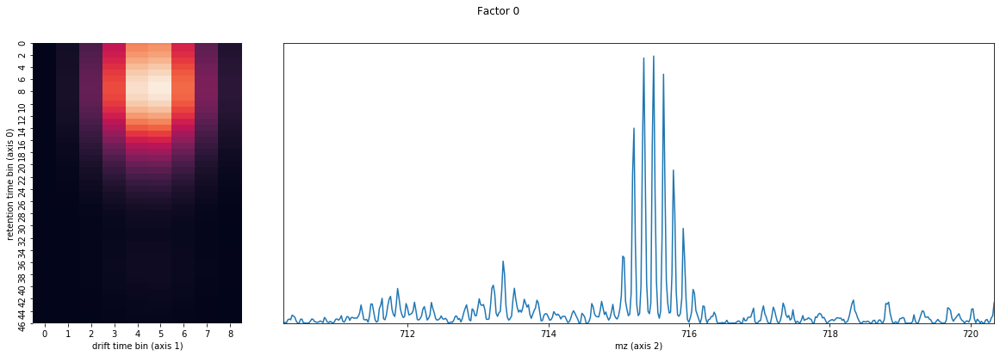

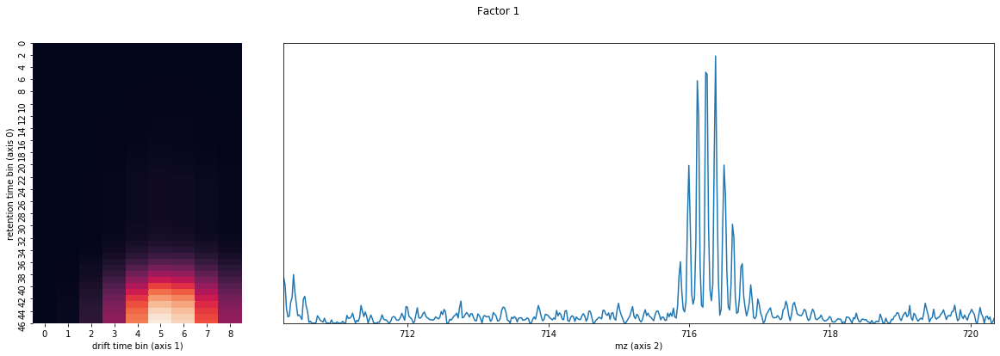

...

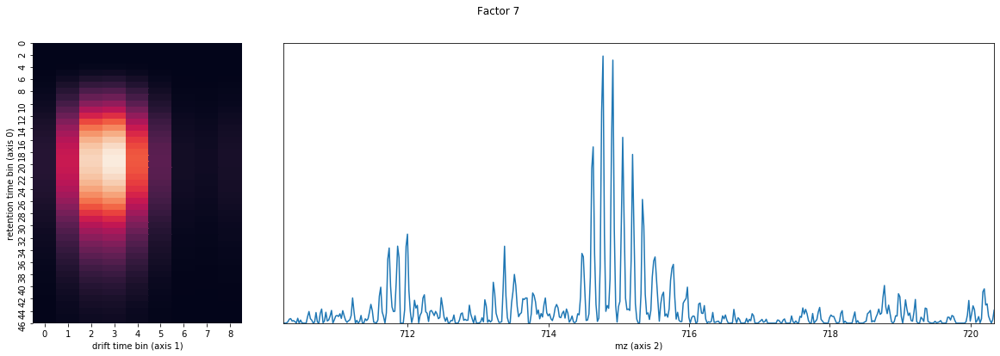

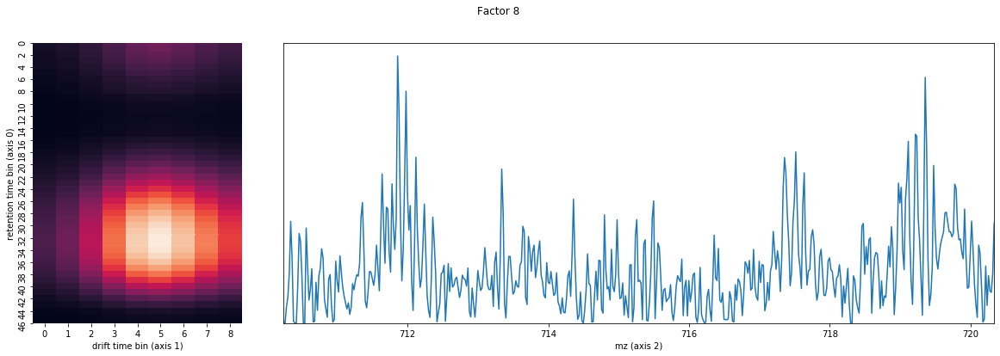

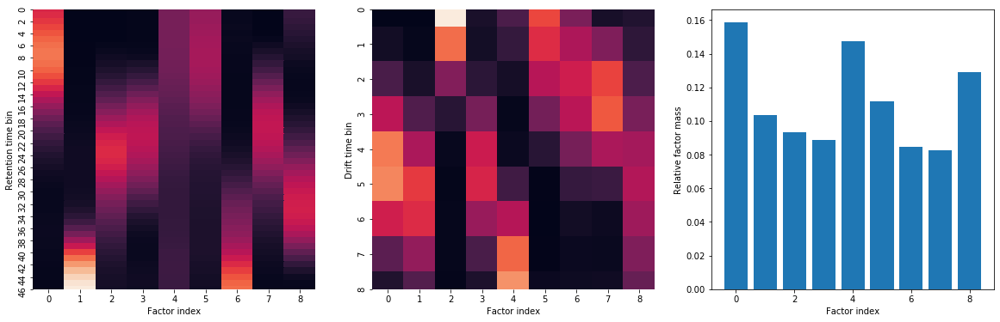

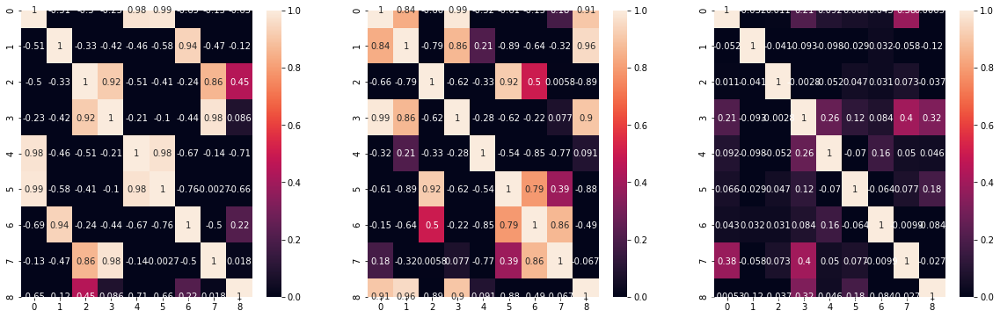

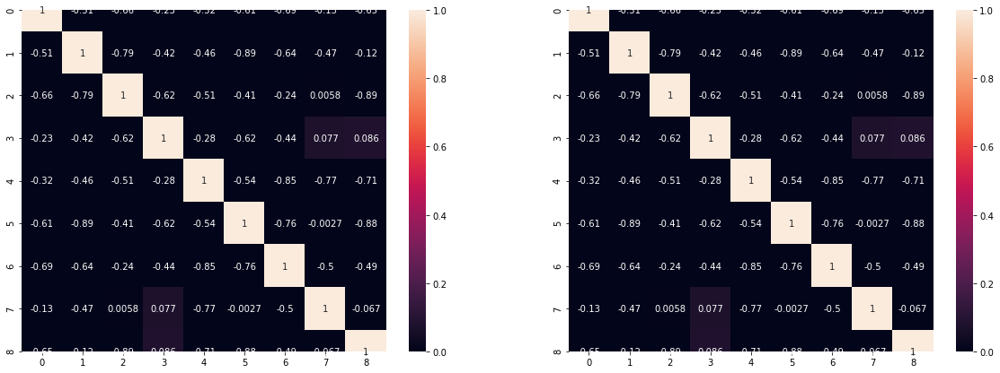

In [15]:
#Our goal is for each factor to be a nice 2D gaussian in dimensions 0 and 1,
#and have a "clean" looking mass spectrum in dimension 2. In particular,
#we expect there to be at least one factor that:
# 1. shows a clean mass spectrum concentrated in the red region,
# 2. peaking in about the 3rd or 4th red bar from the left,
# 3. with very little data outside of the red region.

#in this example it takes at least 5 factors to get the clean peak we
#are looking for, which is factor 3 (counting from 0). Also, factor
#4 seems to be made up of junk (it is not a gaussian in dimensions 1+2)

n_factors = 9
i = 0 #index of protein we are looking at
title = f"{i} {df['name'].values[i]} into {n_factors} factors"
factorize_and_plot(i, n_factors, title, step=10)

(47, 9, 5064)
(47, 9, 5060)
(47, 9, 506, 10)
(47, 9, 506)


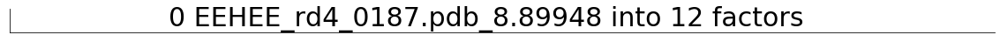

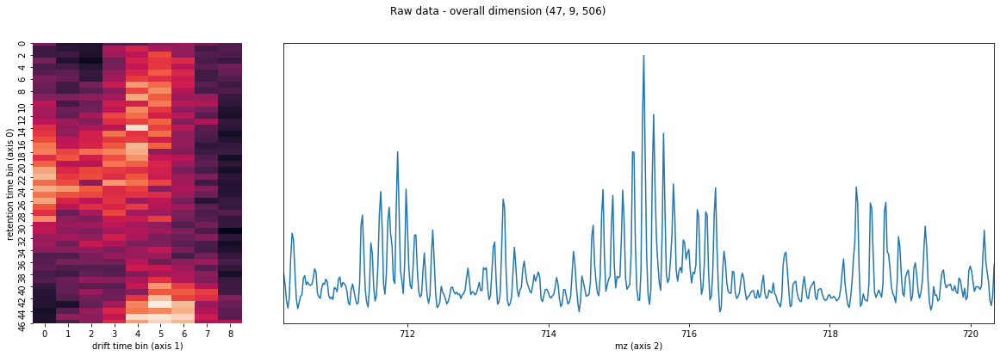

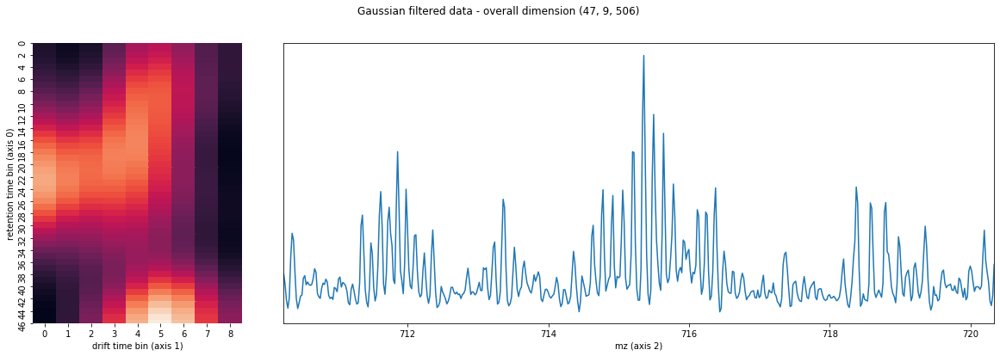

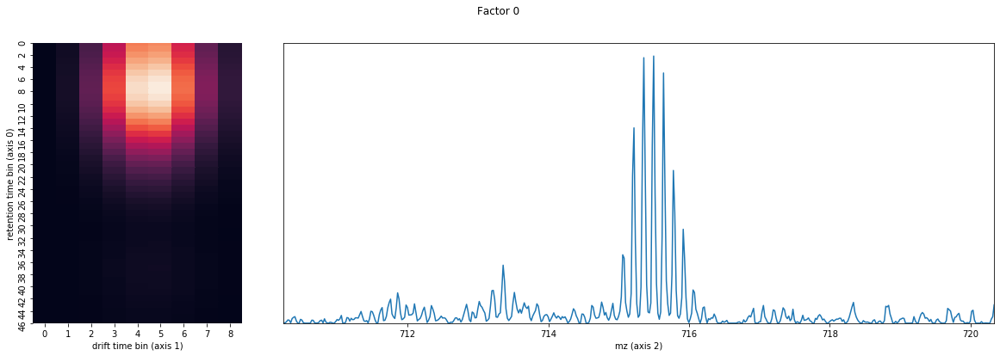

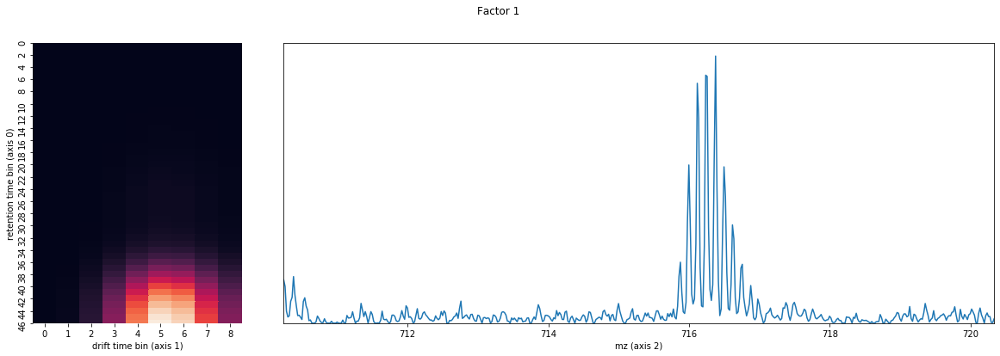

...

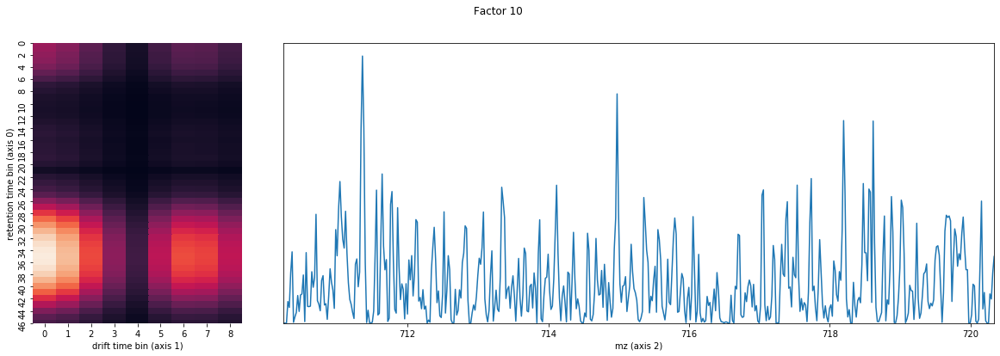

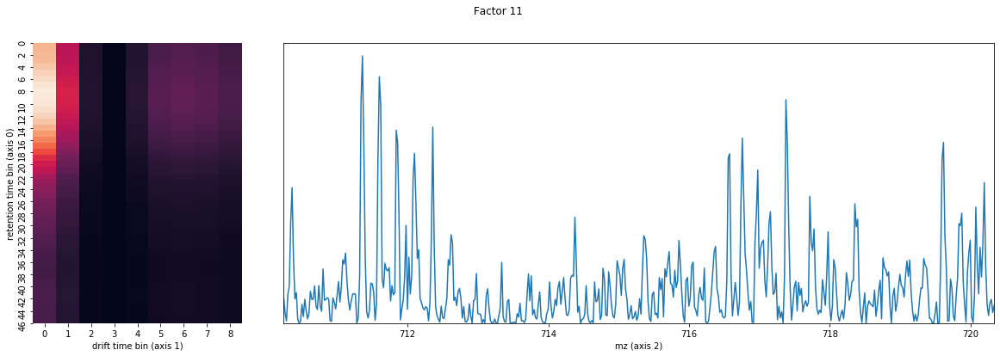

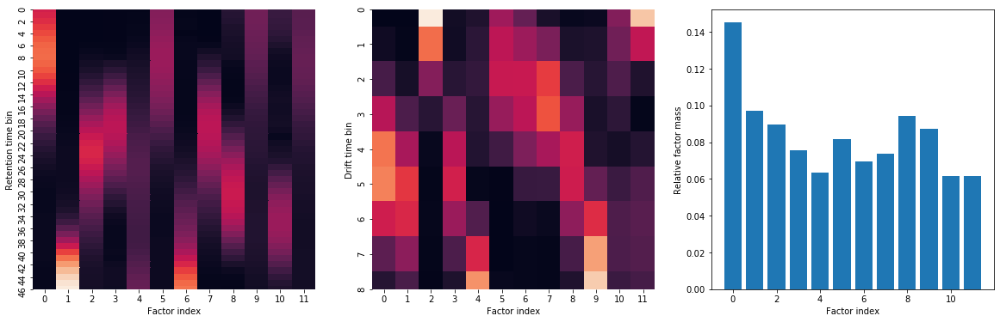

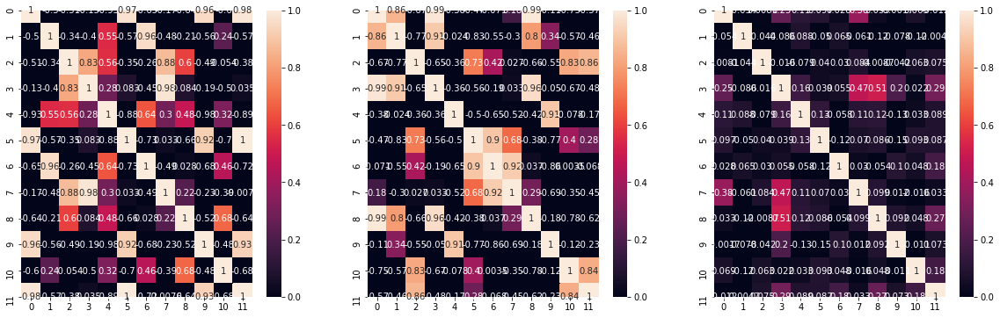

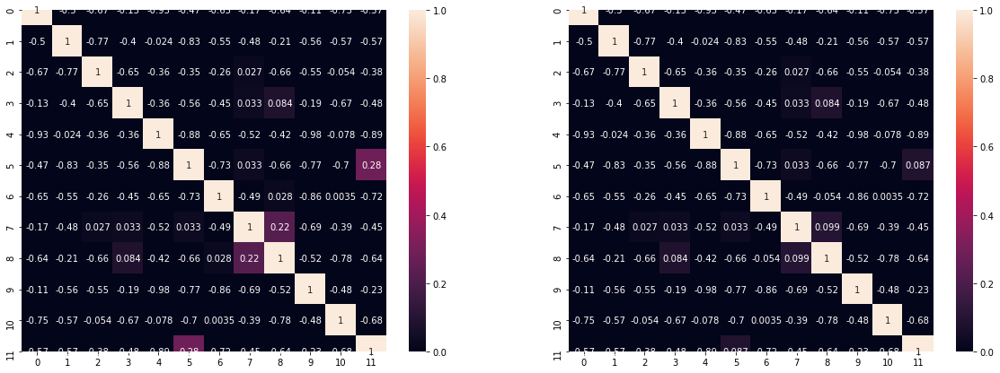

In [16]:
#Our goal is for each factor to be a nice 2D gaussian in dimensions 0 and 1,
#and have a "clean" looking mass spectrum in dimension 2. In particular,
#we expect there to be at least one factor that:
# 1. shows a clean mass spectrum concentrated in the red region,
# 2. peaking in about the 3rd or 4th red bar from the left,
# 3. with very little data outside of the red region.

#in this example it takes at least 5 factors to get the clean peak we
#are looking for, which is factor 3 (counting from 0). Also, factor
#4 seems to be made up of junk (it is not a gaussian in dimensions 1+2)

n_factors = 12
i = 0 #index of protein we are looking at
title = f"{i} {df['name'].values[i]} into {n_factors} factors"
factorize_and_plot(i, n_factors, title, step=10)

(47, 9, 5064)
(47, 9, 5060)
(47, 9, 506, 10)
(47, 9, 506)


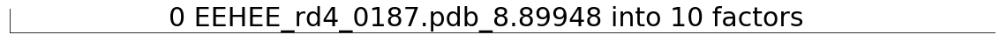

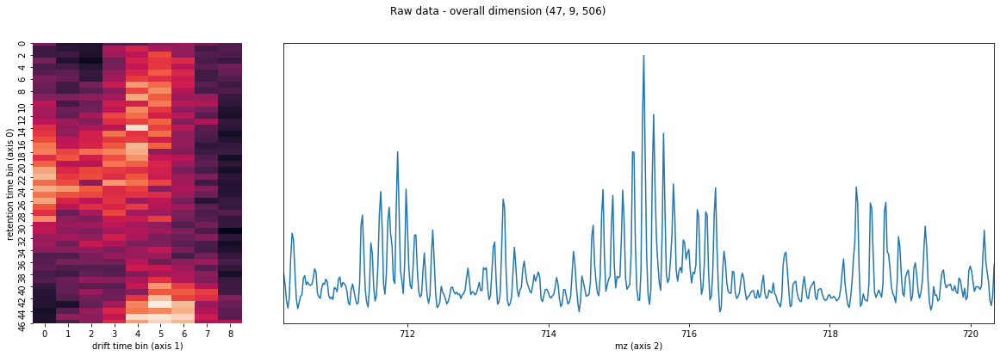

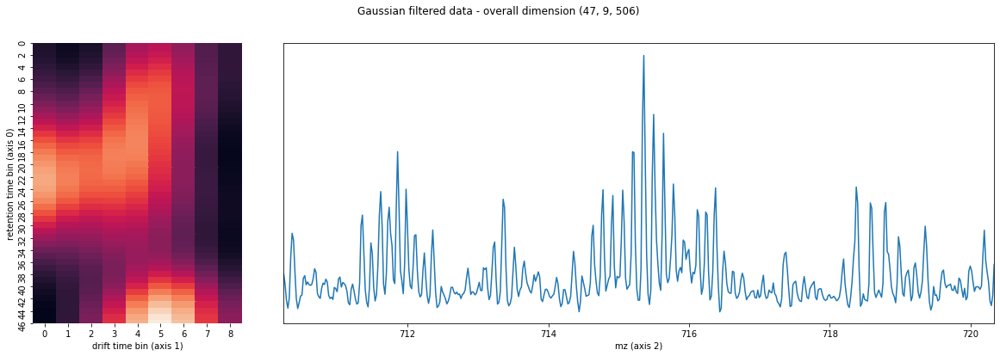

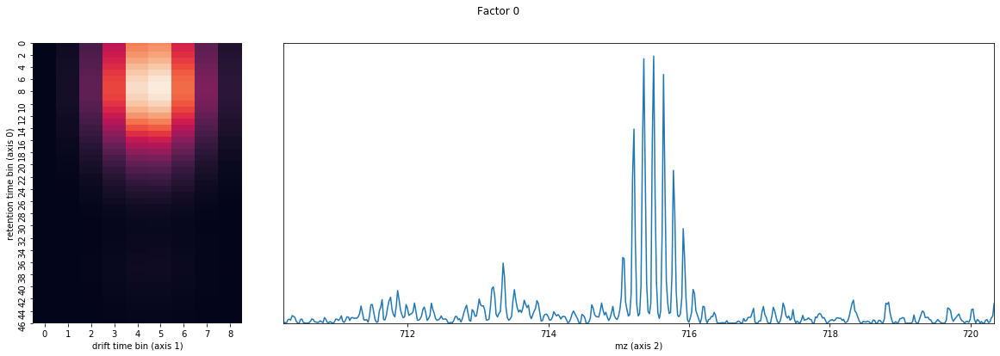

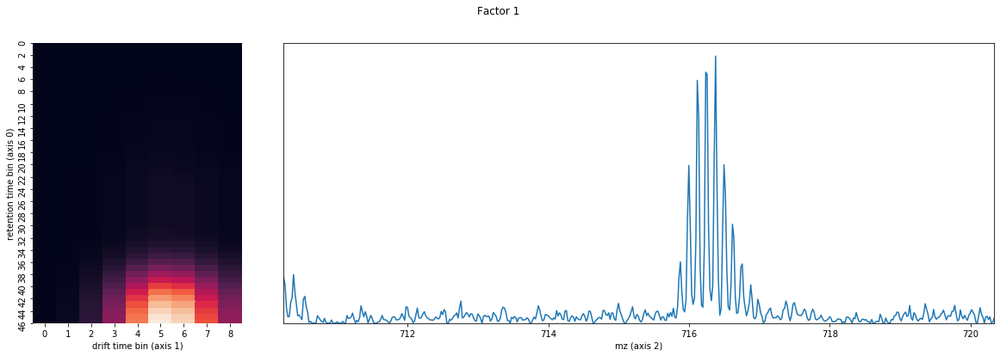

...

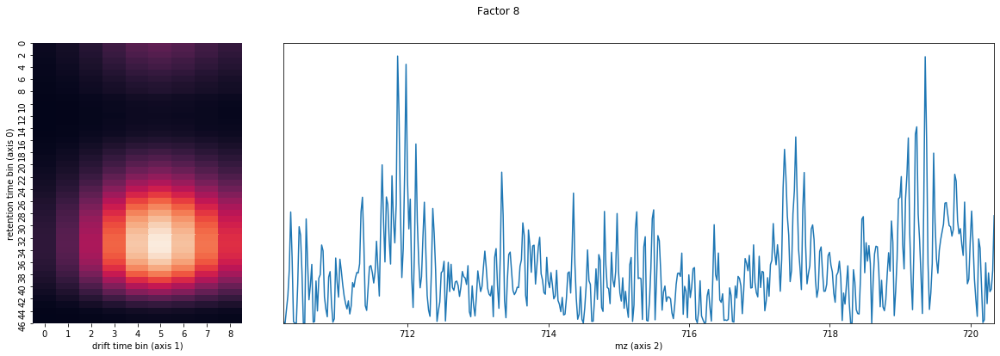

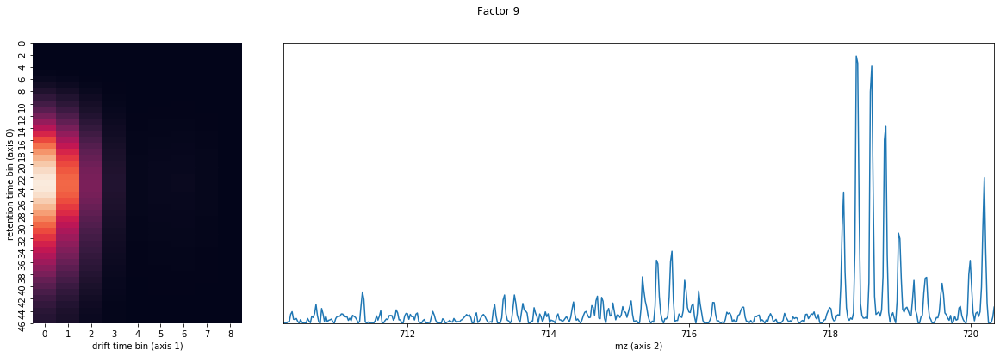

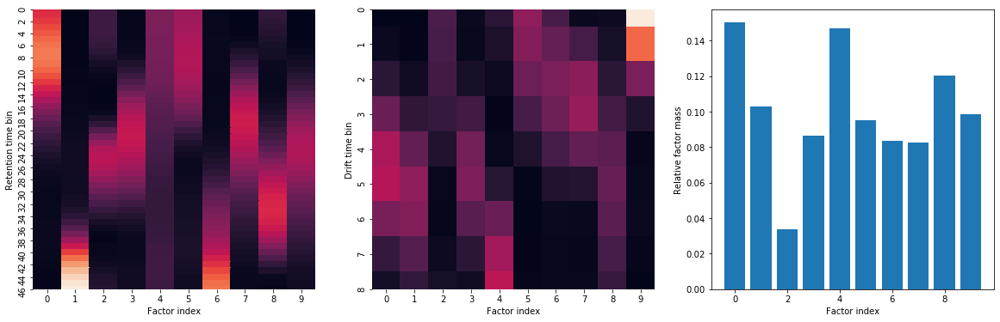

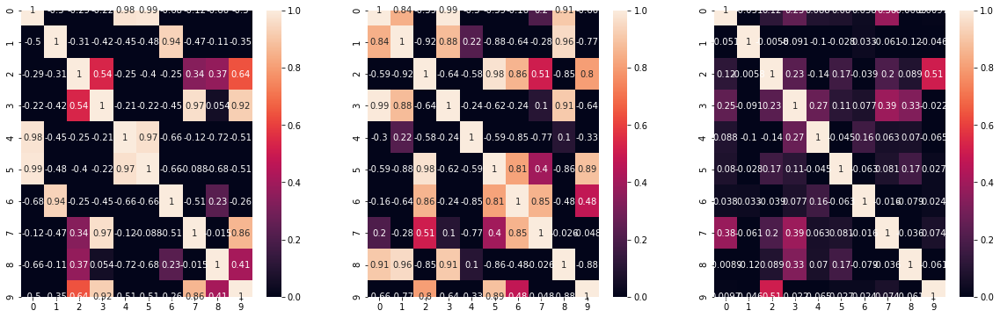

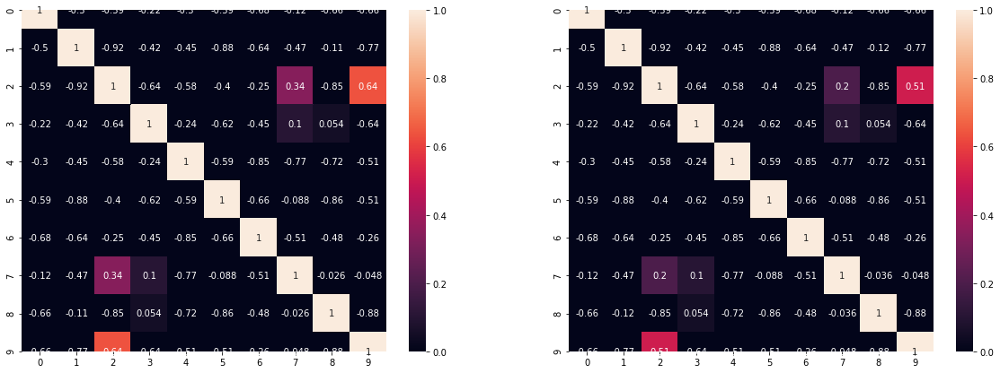

In [17]:
#Our goal is for each factor to be a nice 2D gaussian in dimensions 0 and 1,
#and have a "clean" looking mass spectrum in dimension 2. In particular,
#we expect there to be at least one factor that:
# 1. shows a clean mass spectrum concentrated in the red region,
# 2. peaking in about the 3rd or 4th red bar from the left,
# 3. with very little data outside of the red region.

#in this example it takes at least 5 factors to get the clean peak we
#are looking for, which is factor 3 (counting from 0). Also, factor
#4 seems to be made up of junk (it is not a gaussian in dimensions 1+2)

n_factors = 10
i = 0 #index of protein we are looking at
title = f"{i} {df['name'].values[i]} into {n_factors} factors"
factorize_and_plot(i, n_factors, title, step=10)

(47, 9, 5064)
(47, 9, 5058)
(47, 9, 562, 9)
(47, 9, 562)


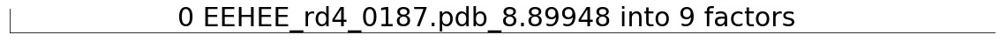

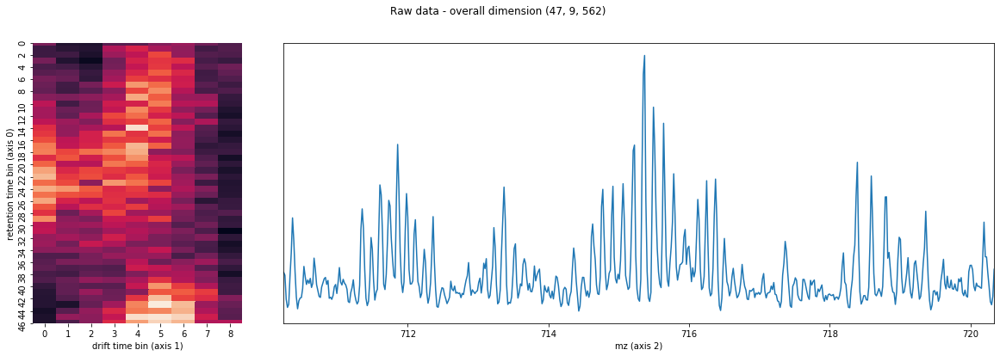

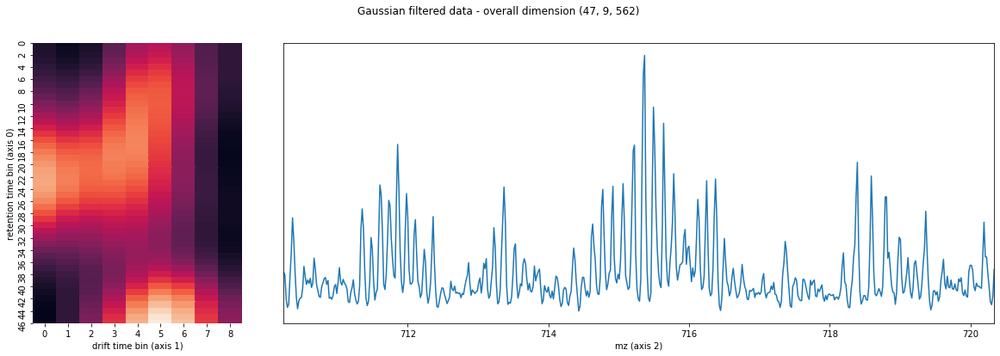

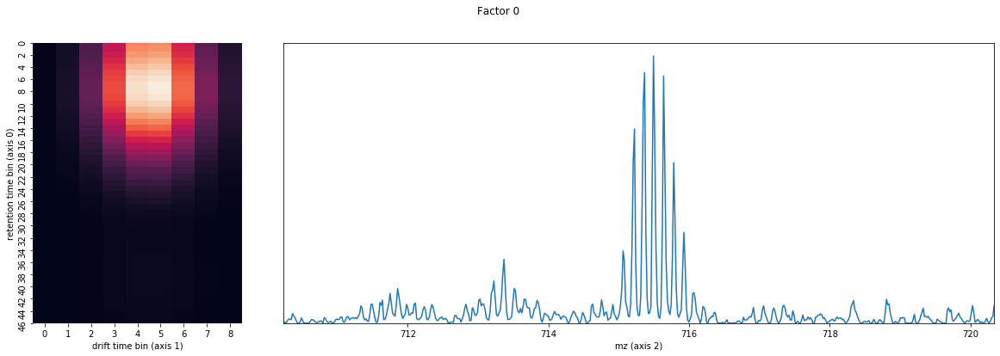

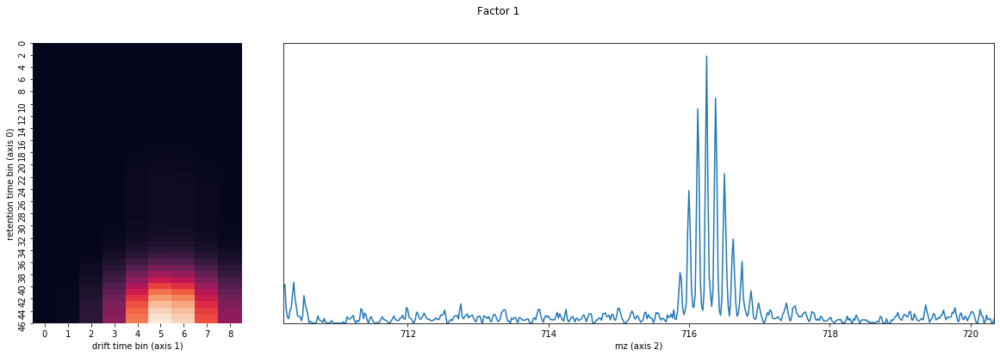

...

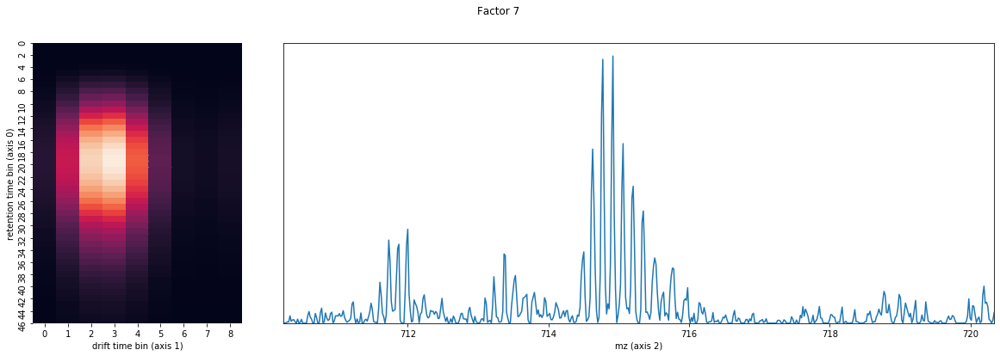

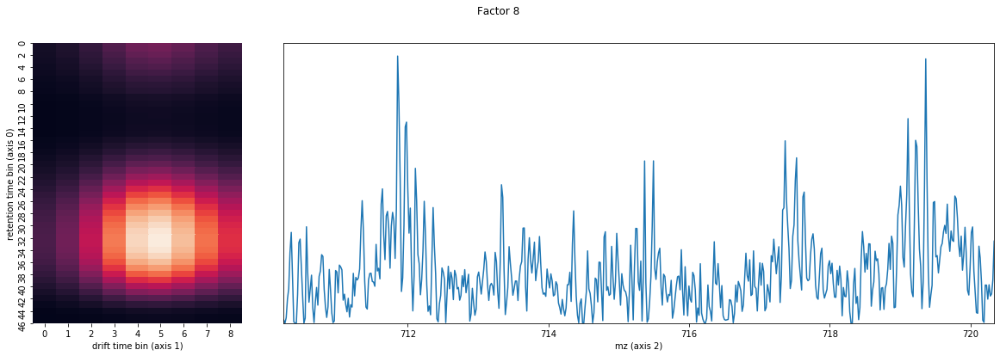

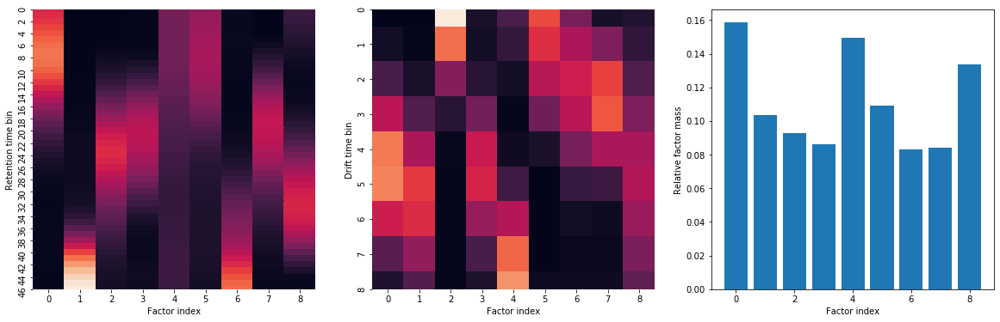

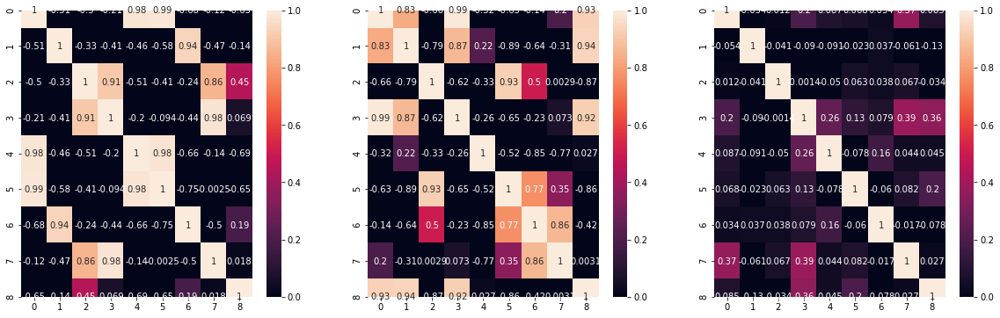

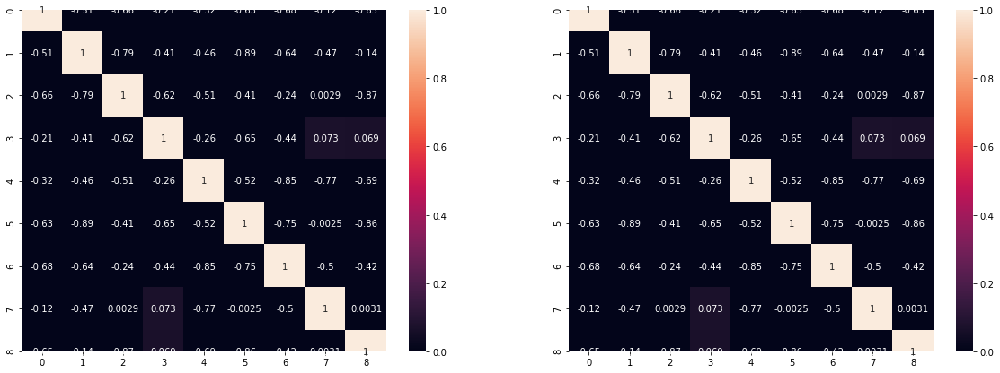

In [18]:
#Our goal is for each factor to be a nice 2D gaussian in dimensions 0 and 1,
#and have a "clean" looking mass spectrum in dimension 2. In particular,
#we expect there to be at least one factor that:
# 1. shows a clean mass spectrum concentrated in the red region,
# 2. peaking in about the 3rd or 4th red bar from the left,
# 3. with very little data outside of the red region.

#in this example it takes at least 5 factors to get the clean peak we
#are looking for, which is factor 3 (counting from 0). Also, factor
#4 seems to be made up of junk (it is not a gaussian in dimensions 1+2)

n_factors = 9
i = 0 #index of protein we are looking at
title = f"{i} {df['name'].values[i]} into {n_factors} factors"
factorize_and_plot(i, n_factors, title, step=9)

(47, 9, 5064)
(47, 9, 0)
(47, 9, 5064, 1)
(47, 9, 5064)


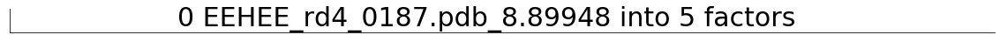

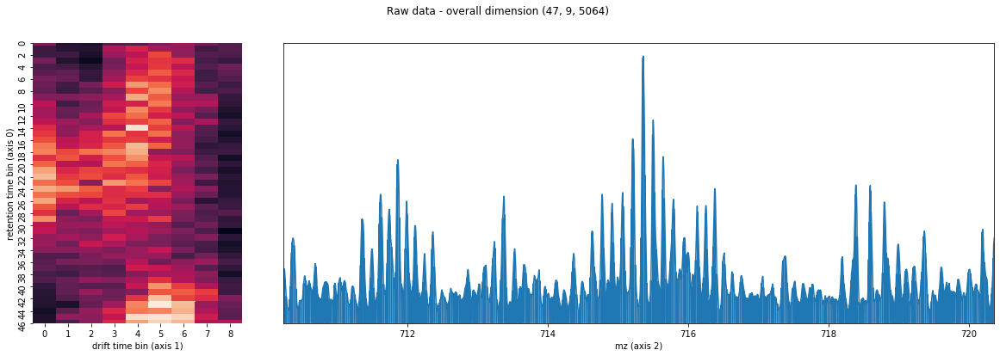

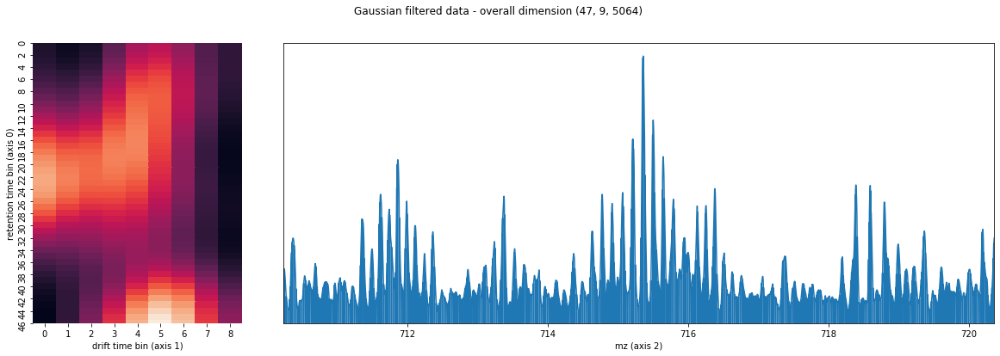

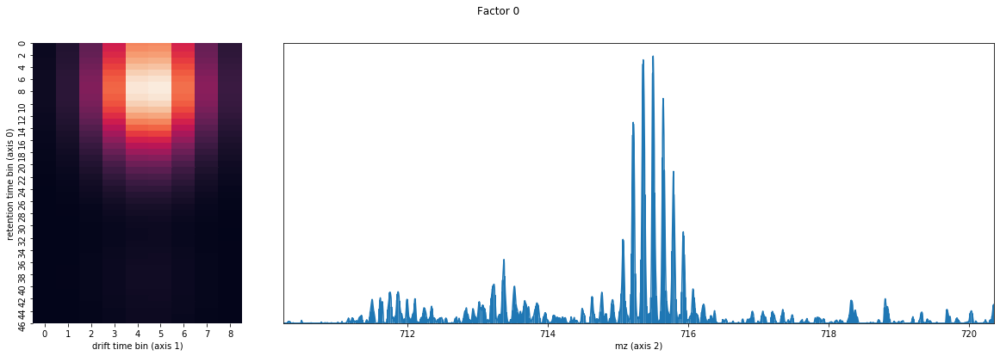

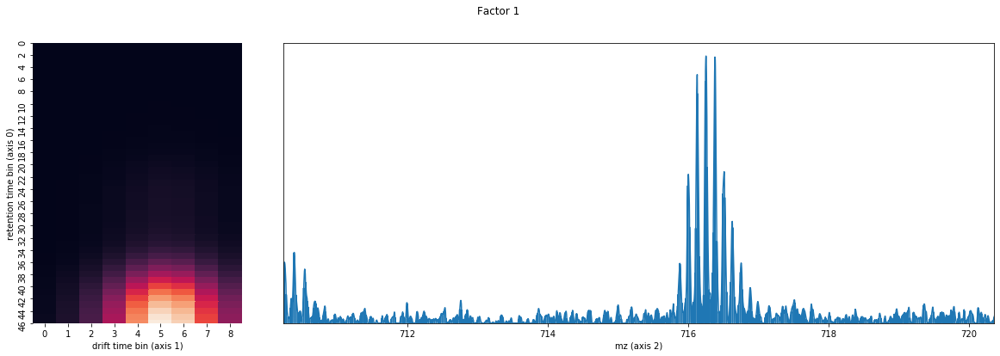

...

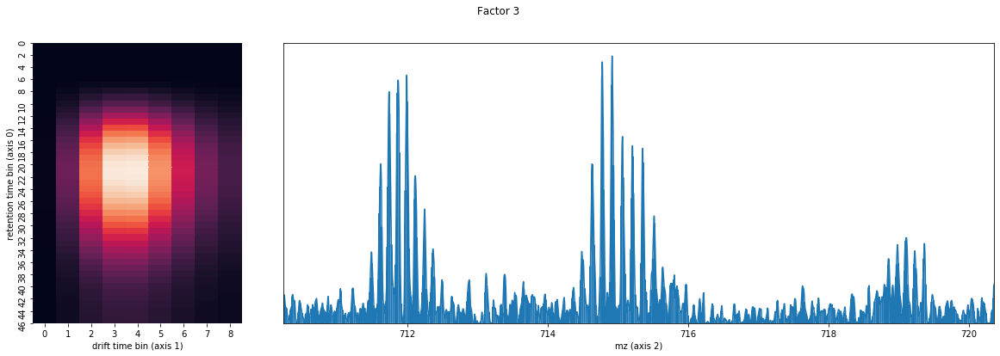

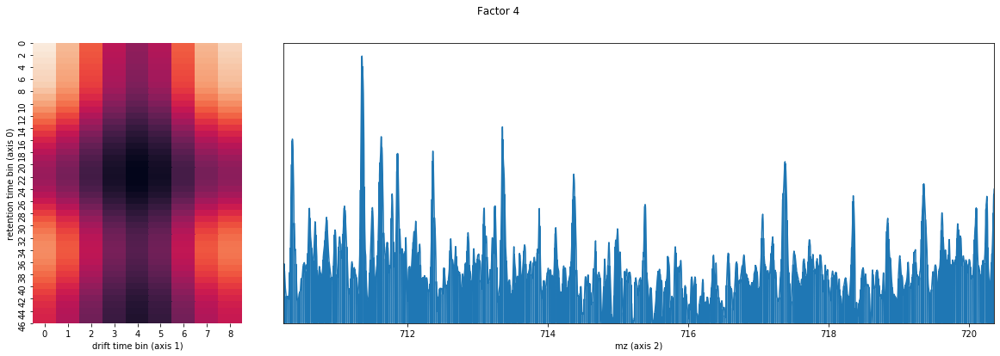

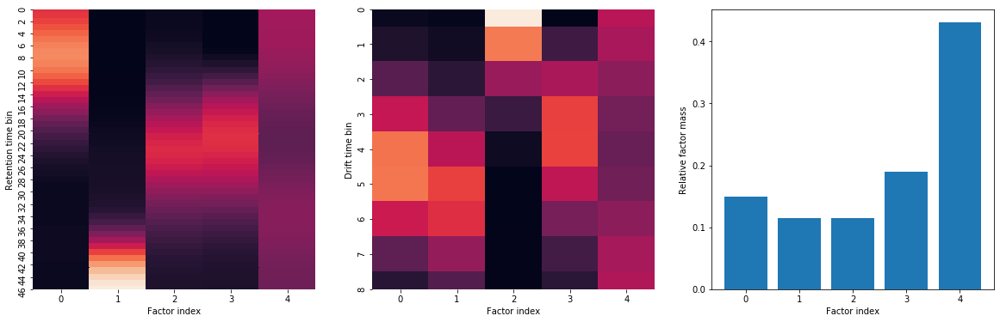

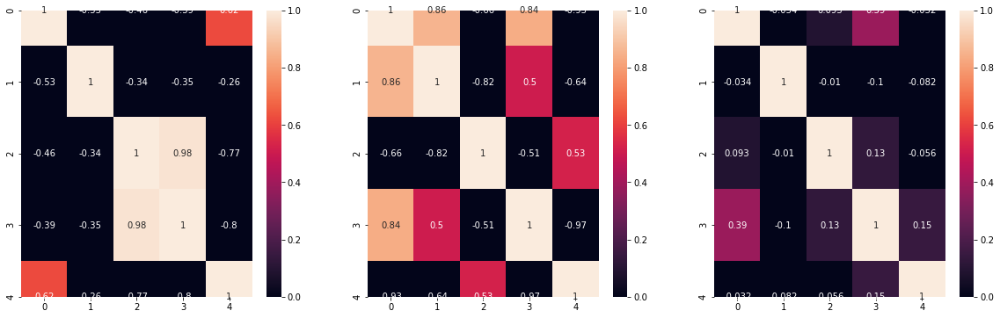

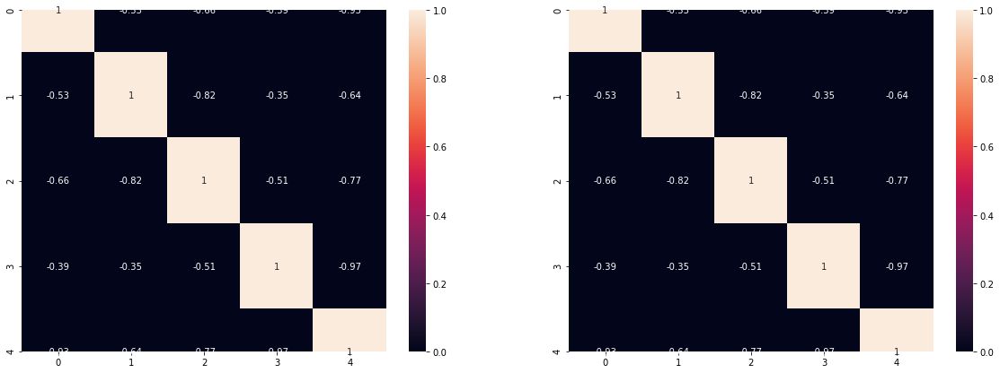

In [19]:
#Our goal is for each factor to be a nice 2D gaussian in dimensions 0 and 1,
#and have a "clean" looking mass spectrum in dimension 2. In particular,
#we expect there to be at least one factor that:
# 1. shows a clean mass spectrum concentrated in the red region,
# 2. peaking in about the 3rd or 4th red bar from the left,
# 3. with very little data outside of the red region.

#in this example it takes at least 5 factors to get the clean peak we
#are looking for, which is factor 3 (counting from 0). Also, factor
#4 seems to be made up of junk (it is not a gaussian in dimensions 1+2)

n_factors = 5
i = 0 #index of protein we are looking at
title = f"{i} {df['name'].values[i]} into {n_factors} factors"
factorize_and_plot(i, n_factors, title)

(47, 9, 5064)
(47, 9, 5060)
(47, 9, 506, 10)
(47, 9, 506)


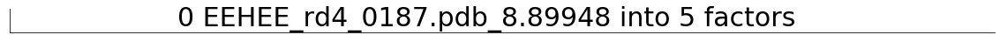

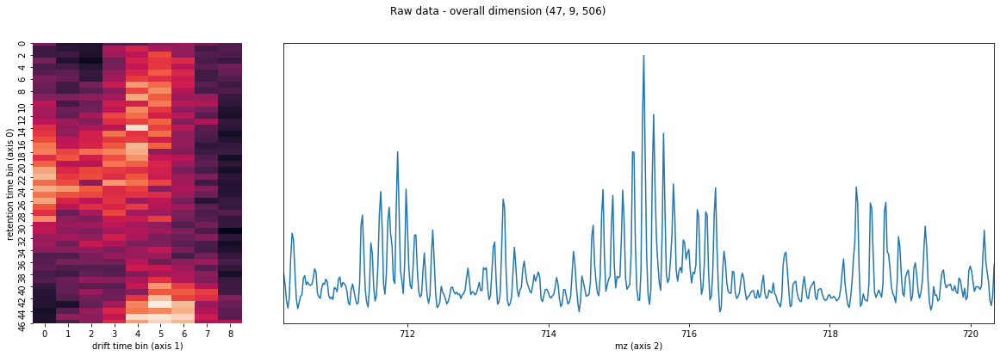

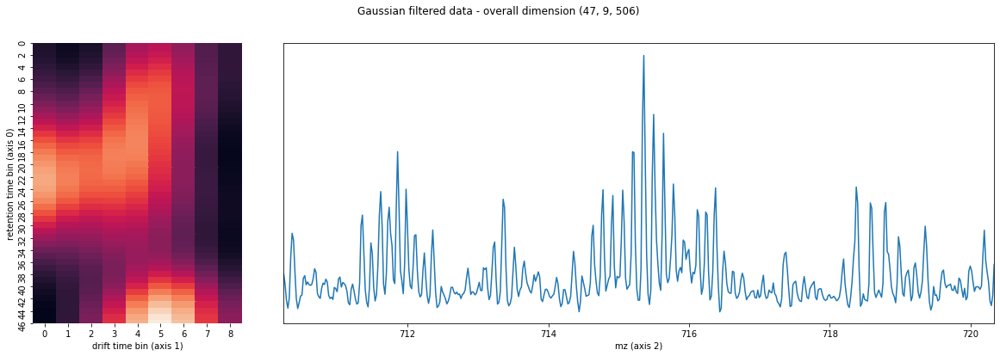

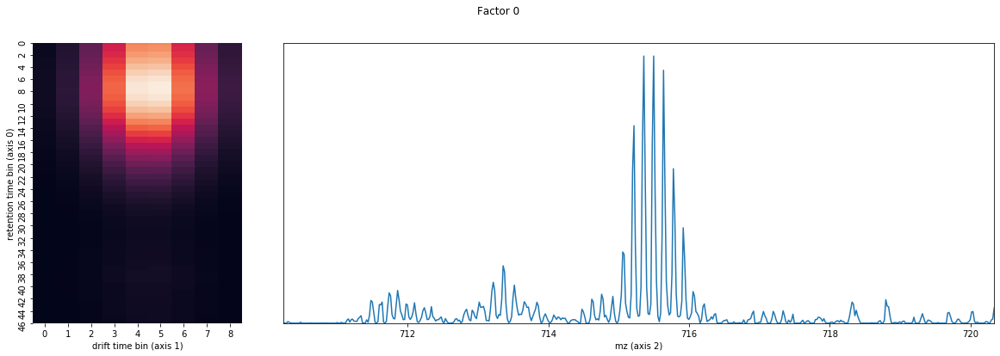

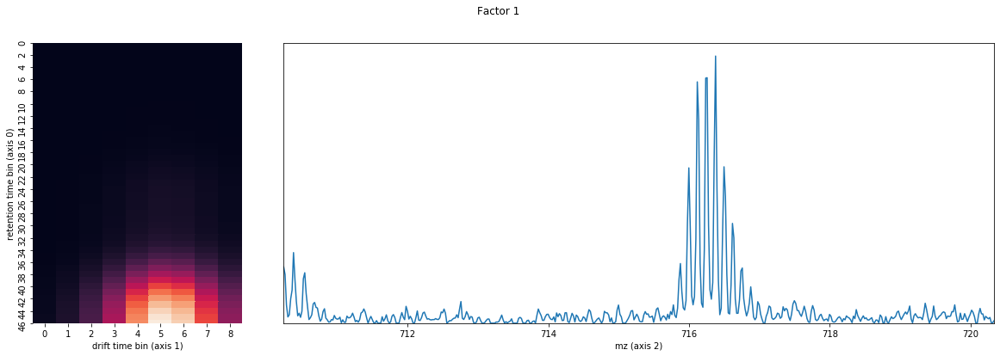

...

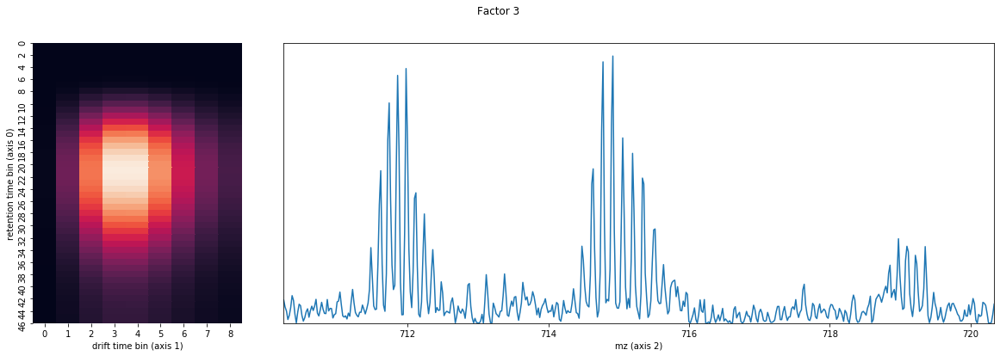

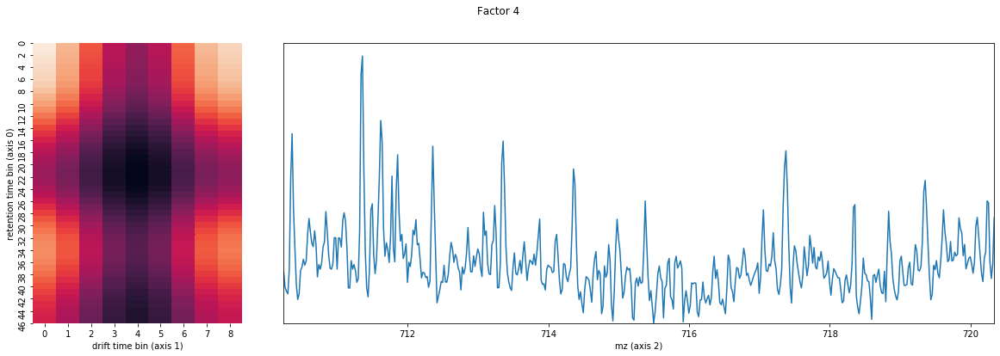

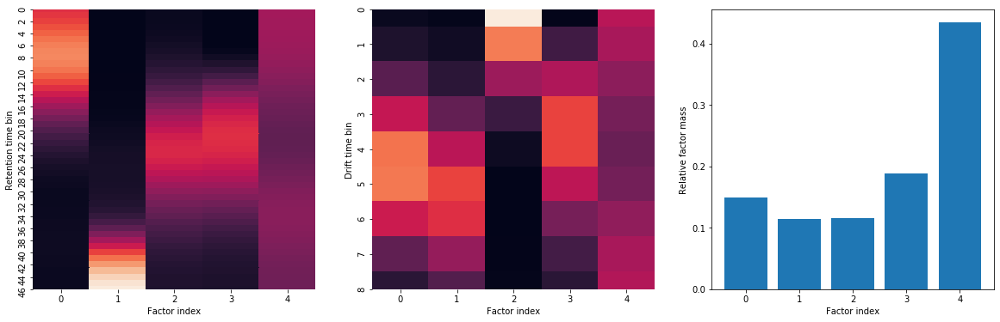

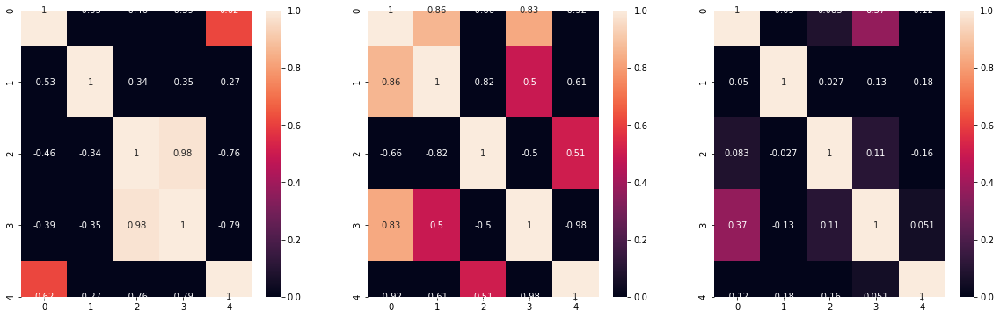

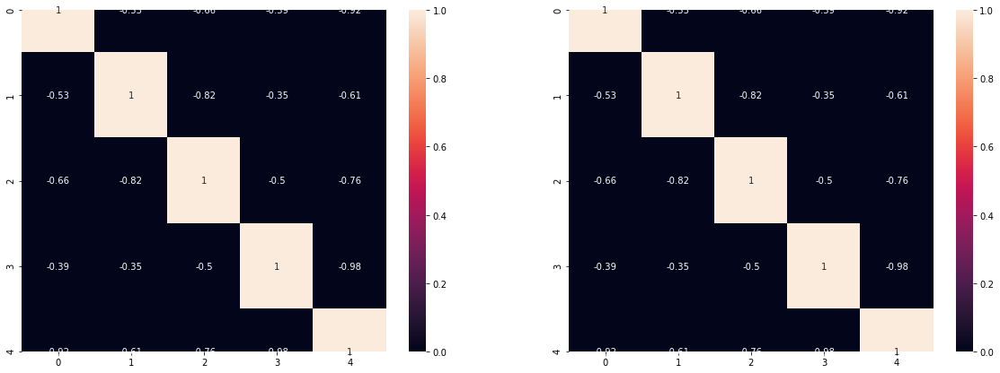

In [20]:
#Our goal is for each factor to be a nice 2D gaussian in dimensions 0 and 1,
#and have a "clean" looking mass spectrum in dimension 2. In particular,
#we expect there to be at least one factor that:
# 1. shows a clean mass spectrum concentrated in the red region,
# 2. peaking in about the 3rd or 4th red bar from the left,
# 3. with very little data outside of the red region.

#in this example it takes at least 5 factors to get the clean peak we
#are looking for, which is factor 3 (counting from 0). Also, factor
#4 seems to be made up of junk (it is not a gaussian in dimensions 1+2)

n_factors = 5
i = 0 #index of protein we are looking at
title = f"{i} {df['name'].values[i]} into {n_factors} factors"
factorize_and_plot(i, n_factors, title,step=10)

(47, 10, 5571)
(47, 10, 5570)
(47, 10, 557, 10)
(47, 10, 557)


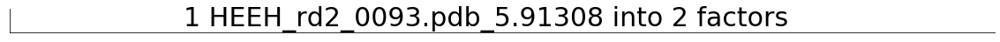

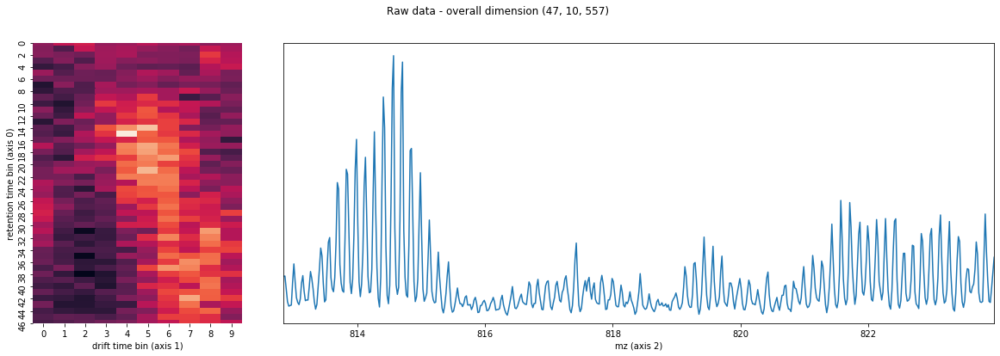

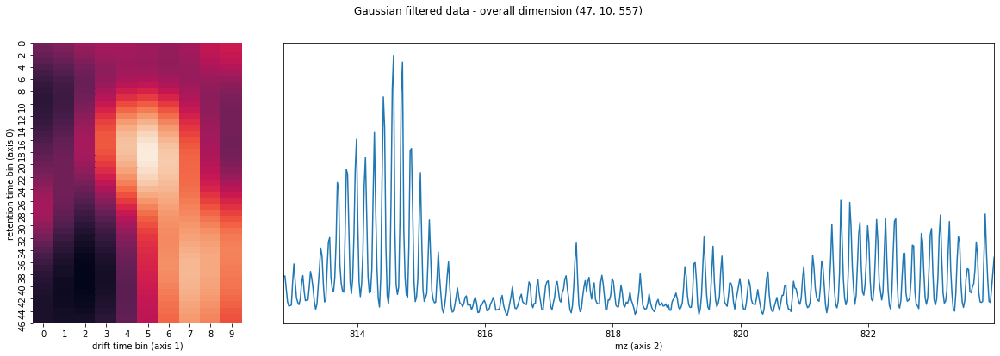

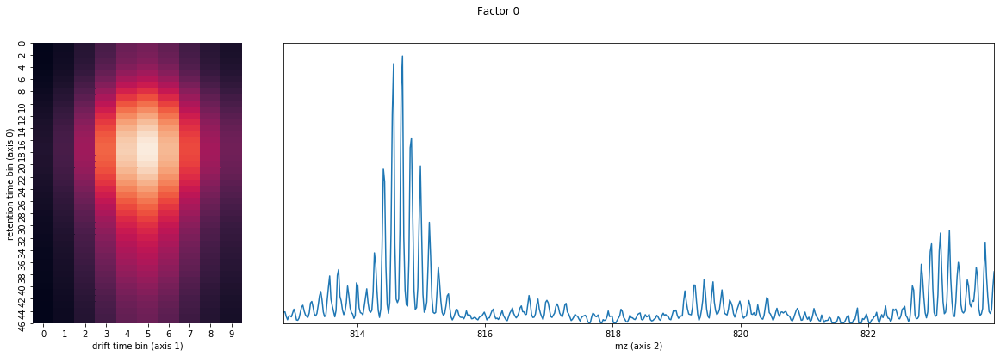

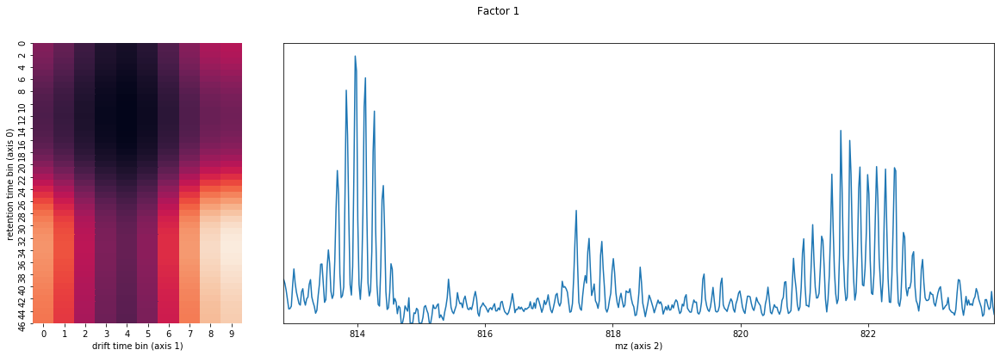

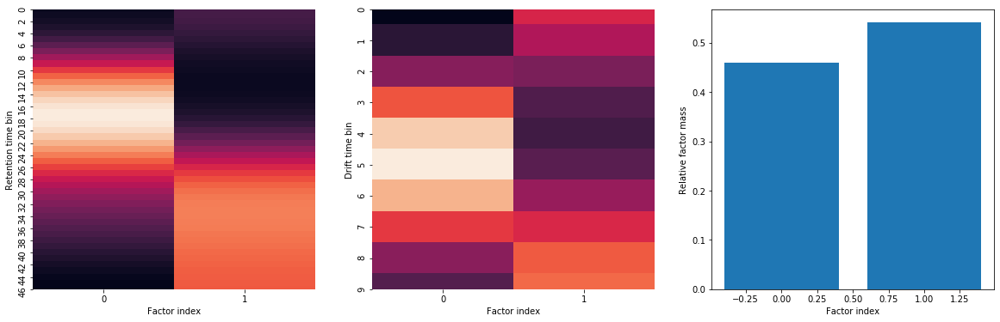

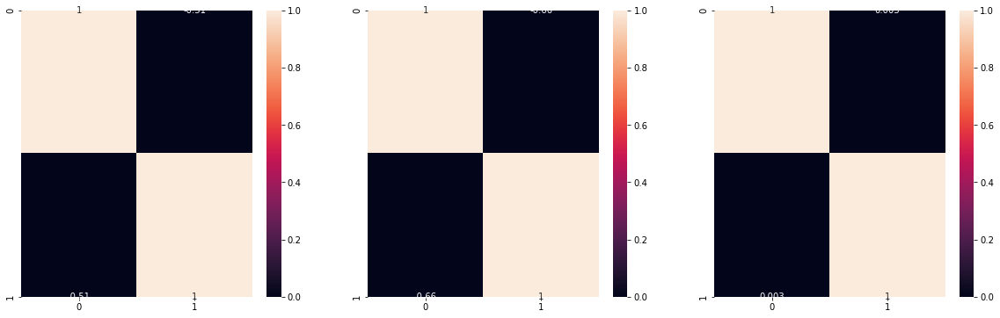

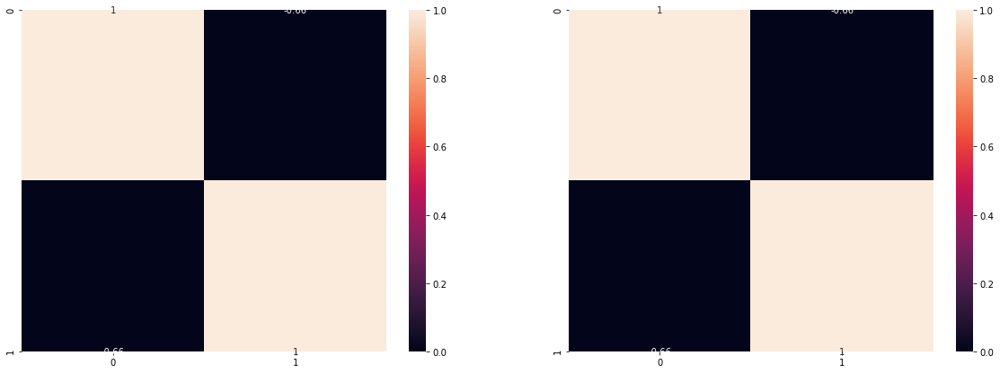

In [21]:
#in this example, only 2 factors are needed to see the clean signal
#we are looking for (factor 0 in the case of 2 factors). However, with
#only 2 factors, factor 1 is clearly made up of different things combined -
#it is not a clean gaussian in dimensions 0+1 like factor 0
n_factors = 2
i = 1
title = f"{i} {df['name'].values[i]} into {n_factors} factors"
factorize_and_plot(i, n_factors, title,step=10)

(47, 10, 5571)
(47, 10, 5570)
(47, 10, 557, 10)
(47, 10, 557)


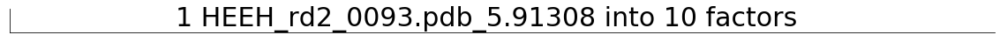

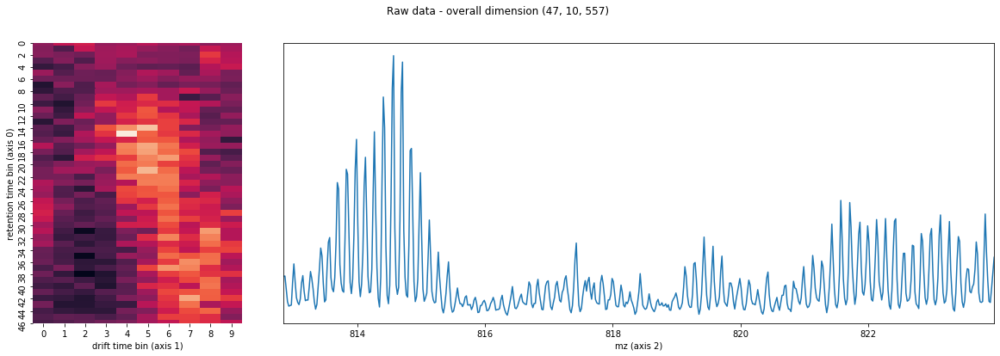

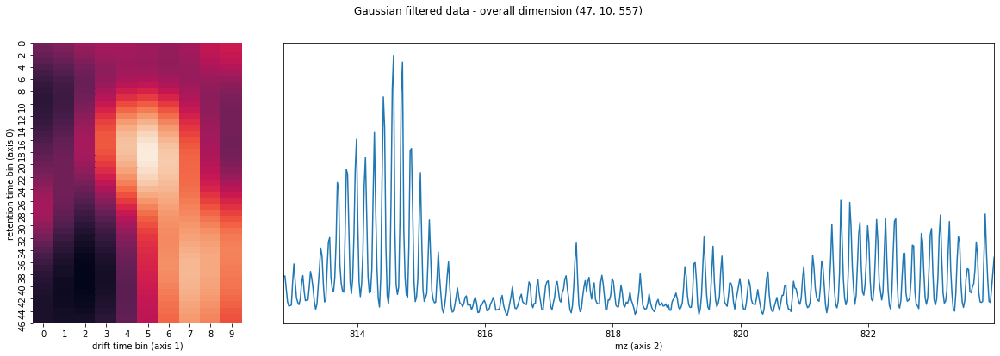

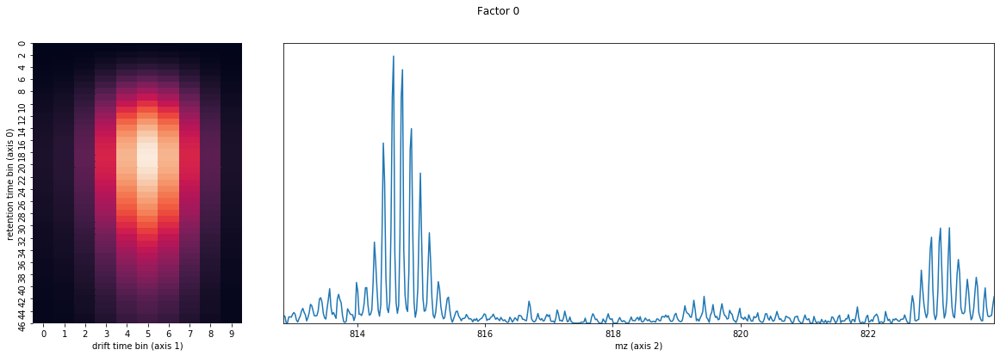

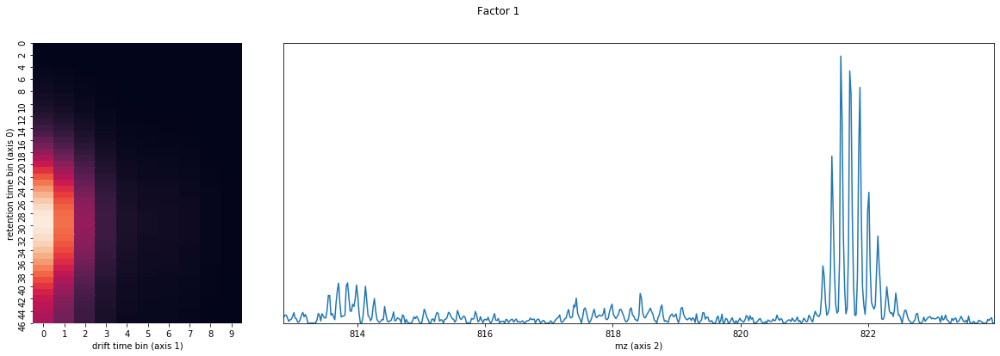

...

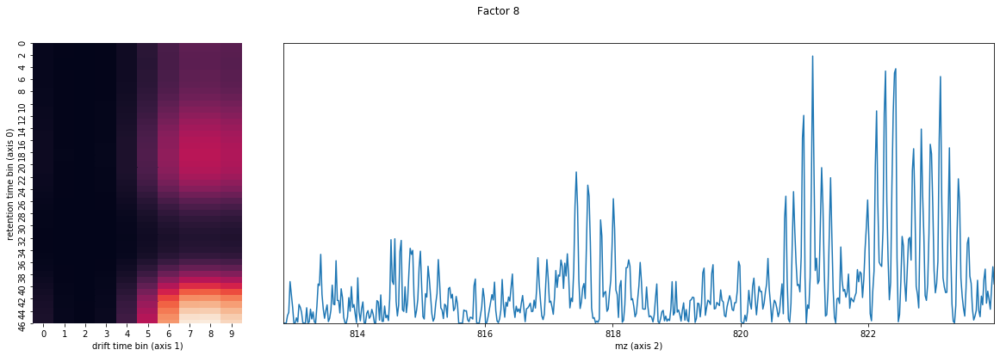

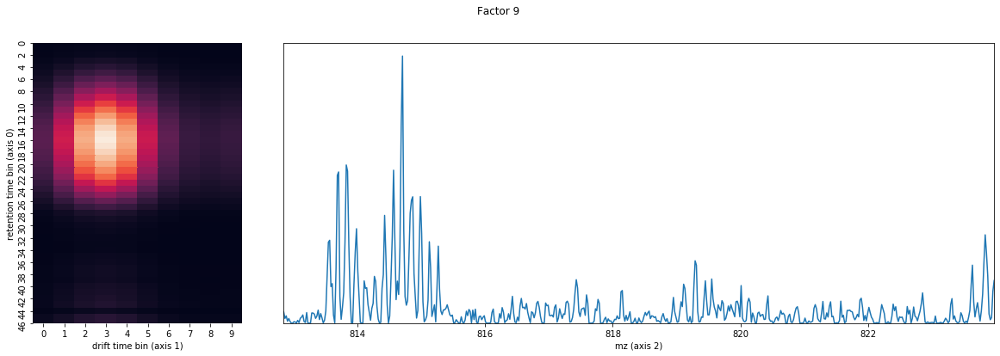

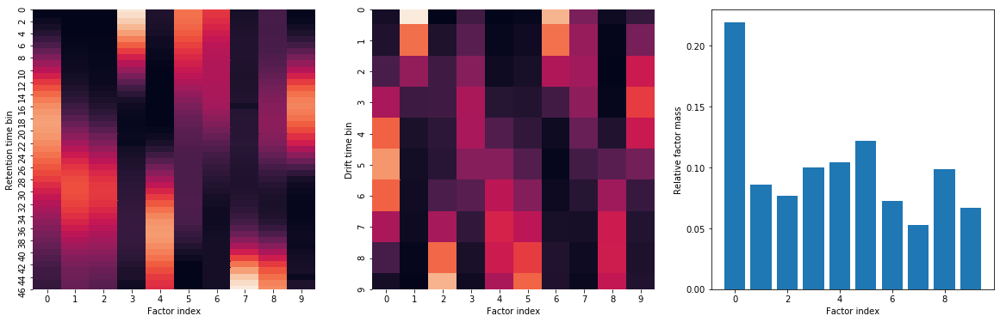

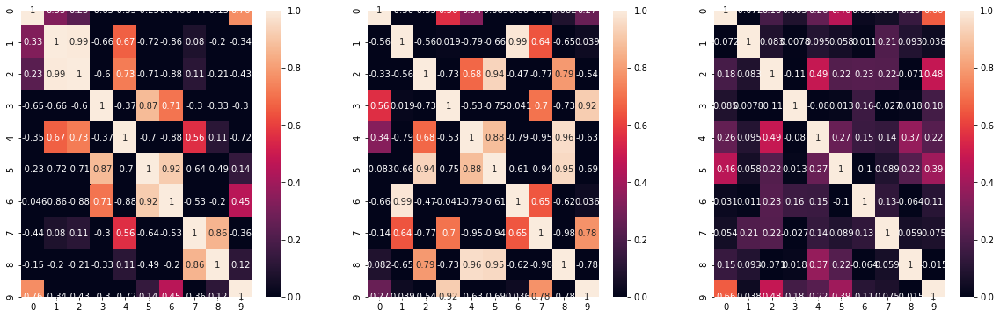

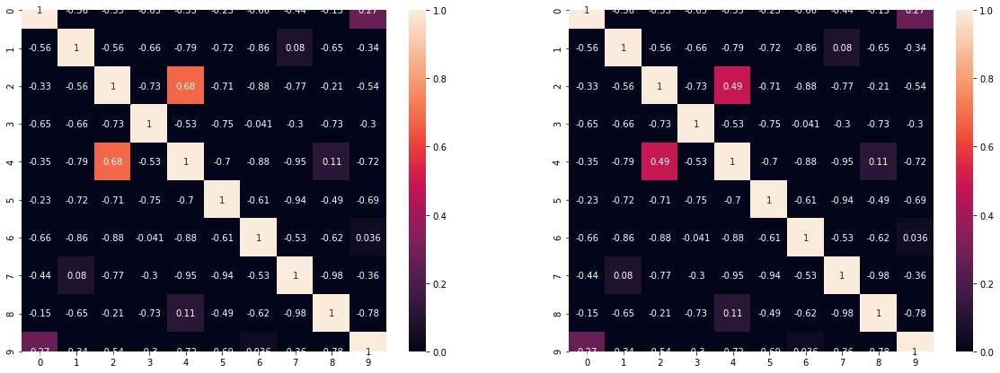

In [22]:
#in this example, only 2 factors are needed to see the clean signal
#we are looking for (factor 0 in the case of 2 factors). However, with
#only 2 factors, factor 1 is clearly made up of different things combined -
#it is not a clean gaussian in dimensions 0+1 like factor 0
n_factors = 10
i = 1
title = f"{i} {df['name'].values[i]} into {n_factors} factors"
factorize_and_plot(i, n_factors, title,step=10)

(47, 10, 5571)
(47, 10, 5570)
(47, 10, 557, 10)
(47, 10, 557)


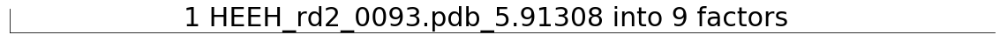

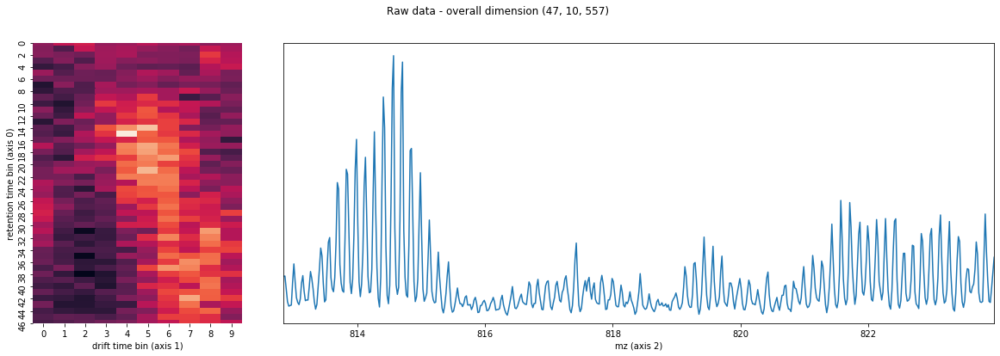

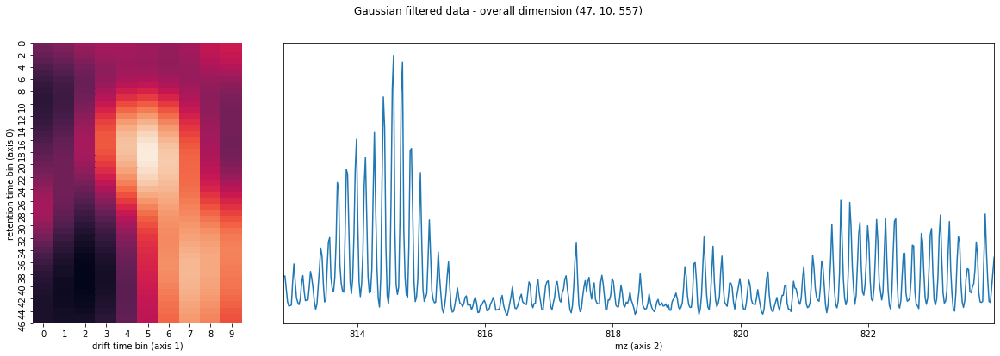

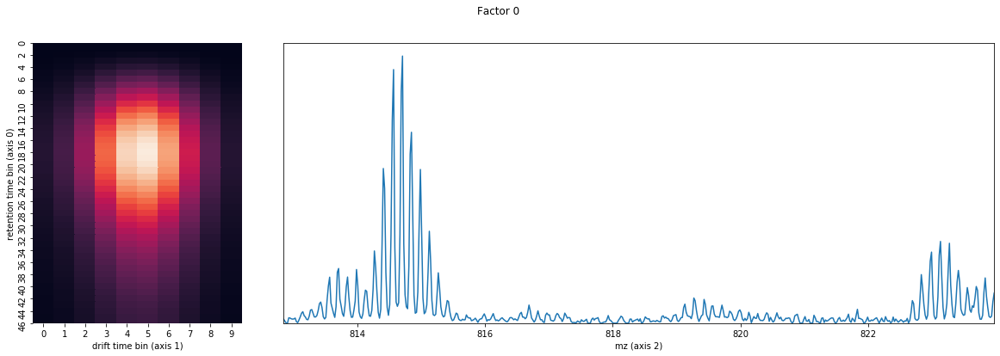

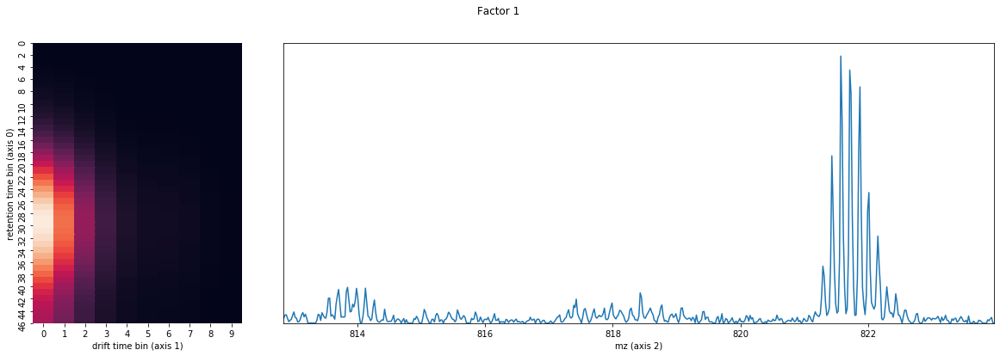

...

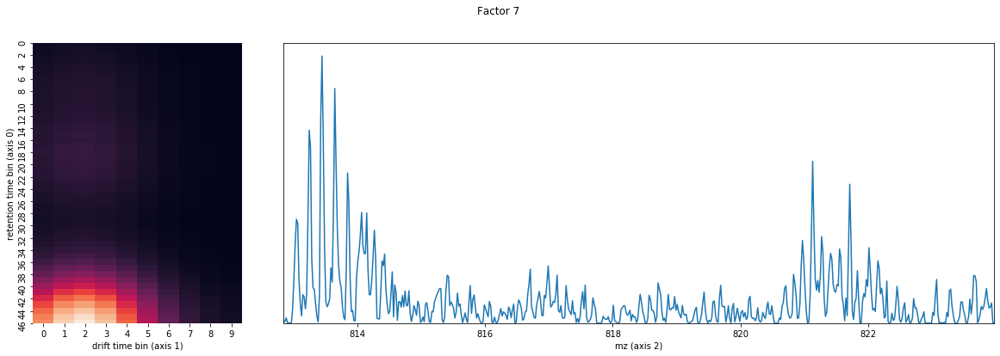

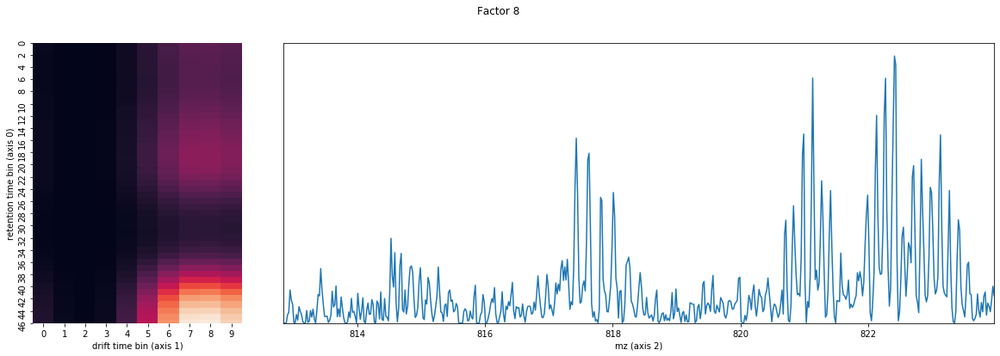

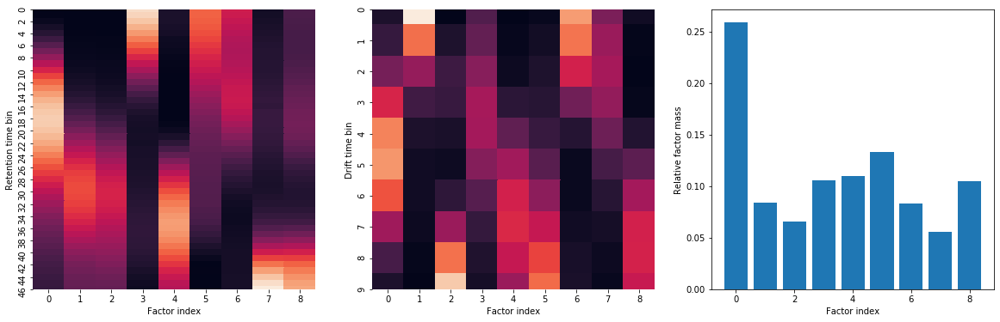

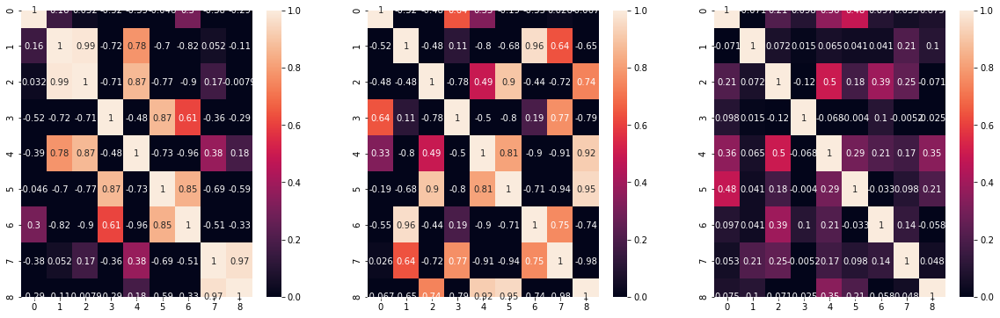

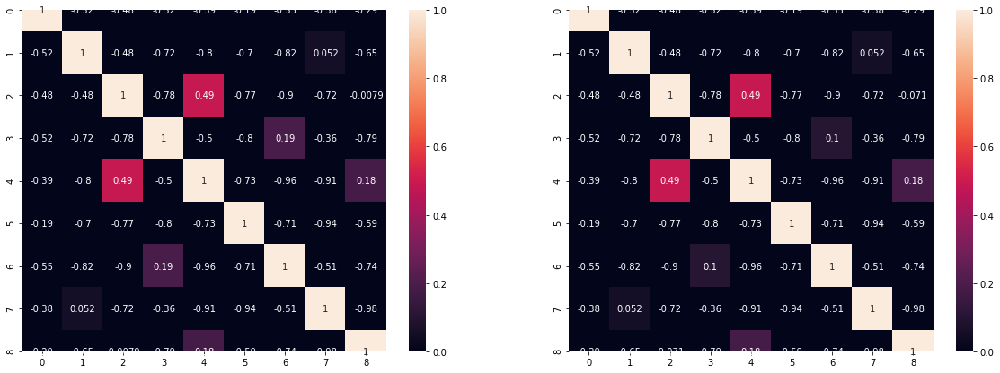

In [23]:
#in this example, only 2 factors are needed to see the clean signal
#we are looking for (factor 0 in the case of 2 factors). However, with
#only 2 factors, factor 1 is clearly made up of different things combined -
#it is not a clean gaussian in dimensions 0+1 like factor 0
n_factors = 9
i = 1
title = f"{i} {df['name'].values[i]} into {n_factors} factors"
factorize_and_plot(i, n_factors, title,step=10)

(47, 10, 5358)
(47, 10, 0)
(47, 10, 5358, 1)
(47, 10, 5358)


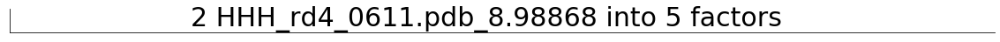

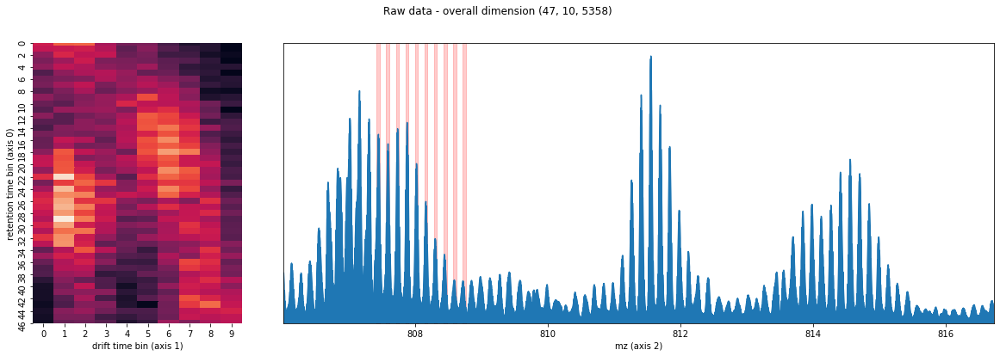

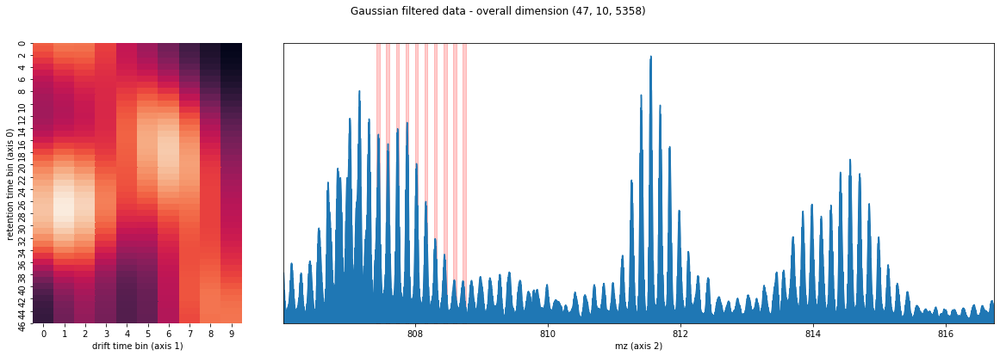

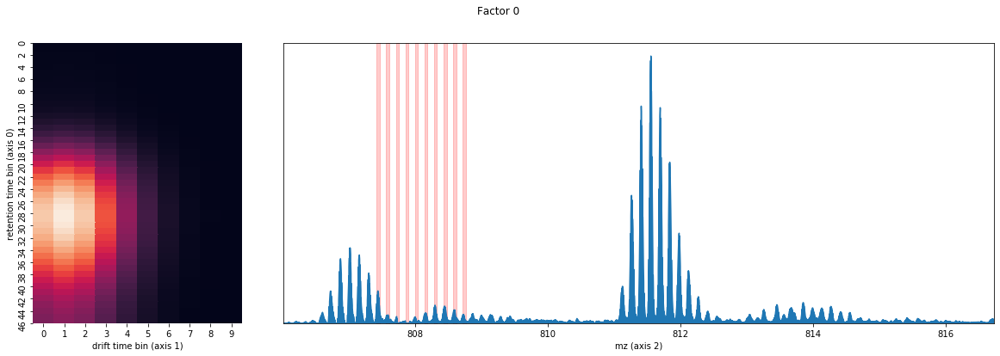

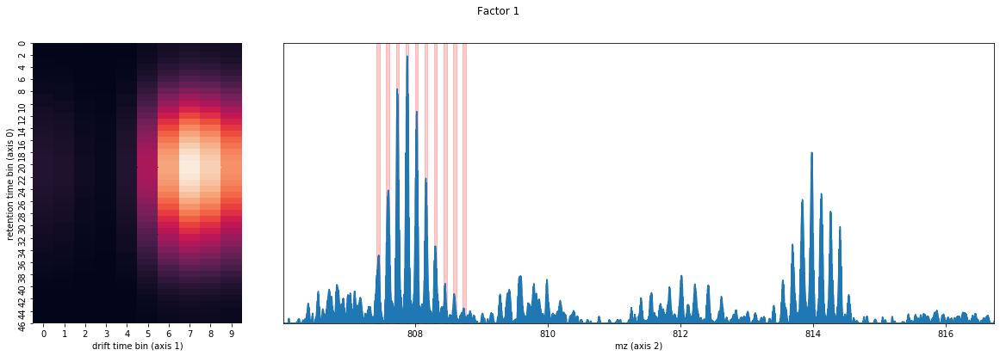

...

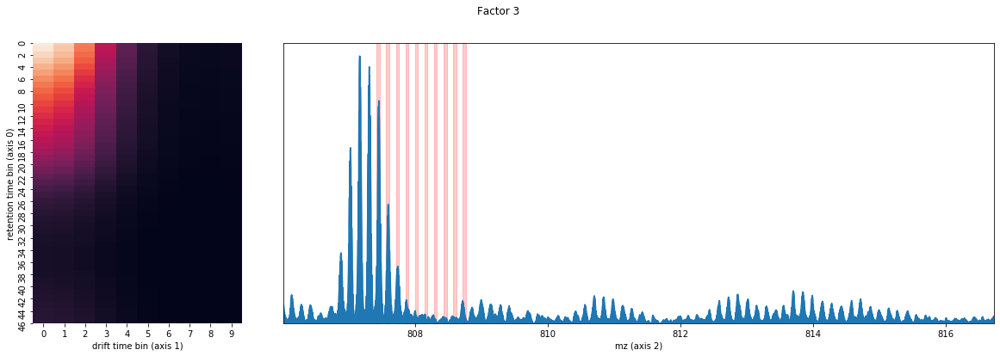

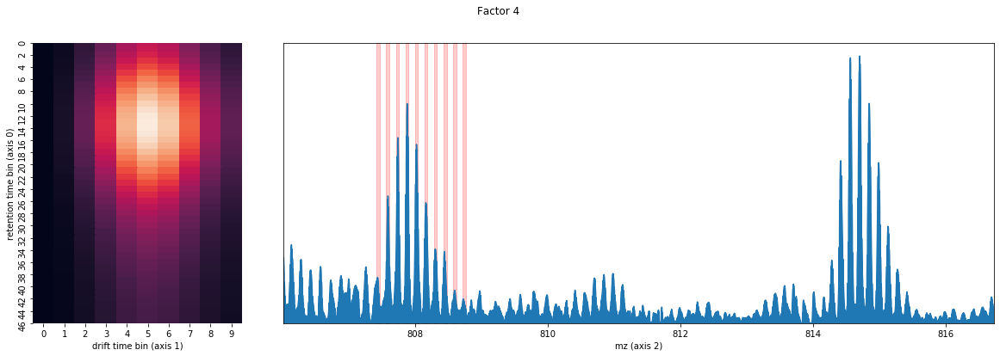

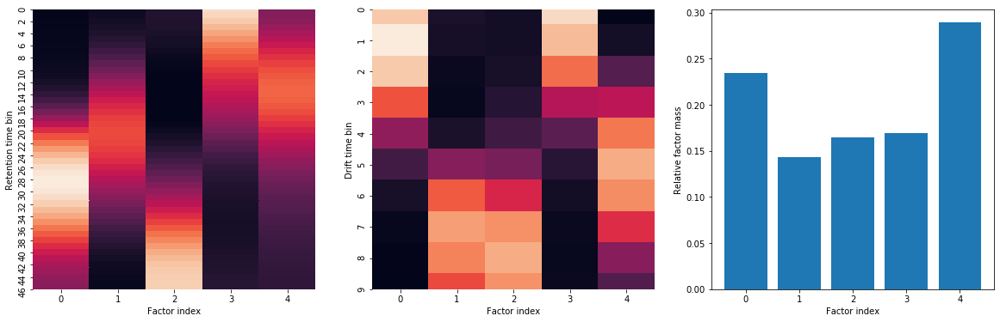

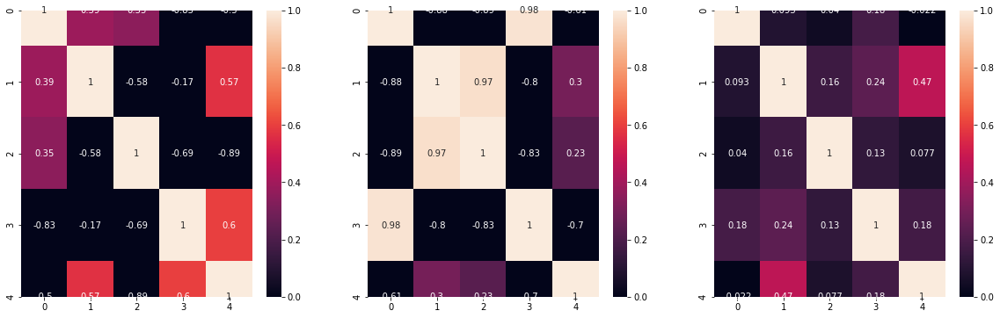

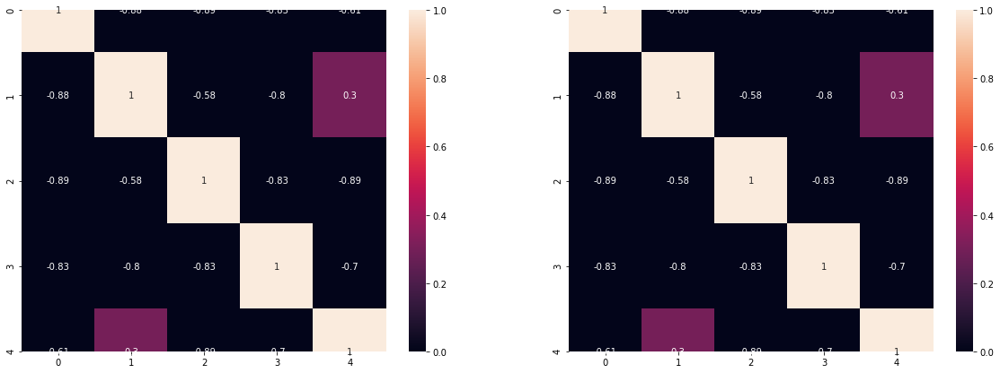

In [24]:
#this example factorizes very cleanly at 5 factors, giving us
#our target factor in factor 1
n_factors = 5
i = 2
title = f"{i} {df['name'].values[i]} into {n_factors} factors"
factorize_and_plot(i, n_factors, title)

(47, 9, 5143)
(47, 9, 0)
(47, 9, 5143, 1)
(47, 9, 5143)


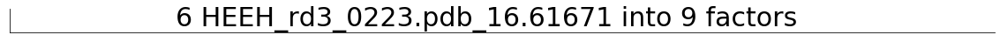

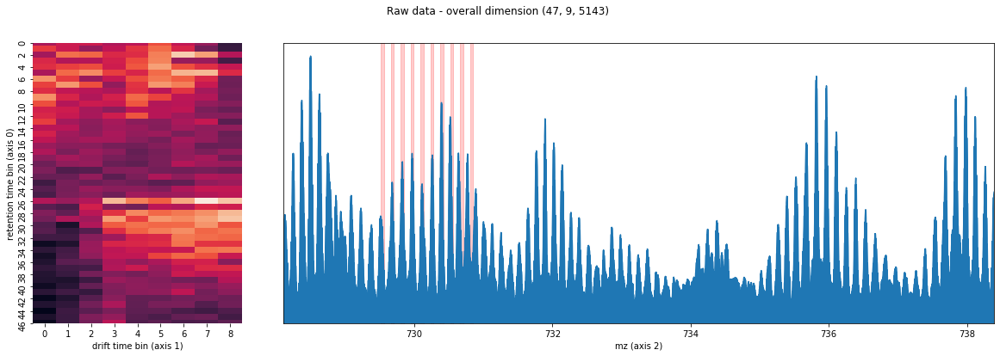

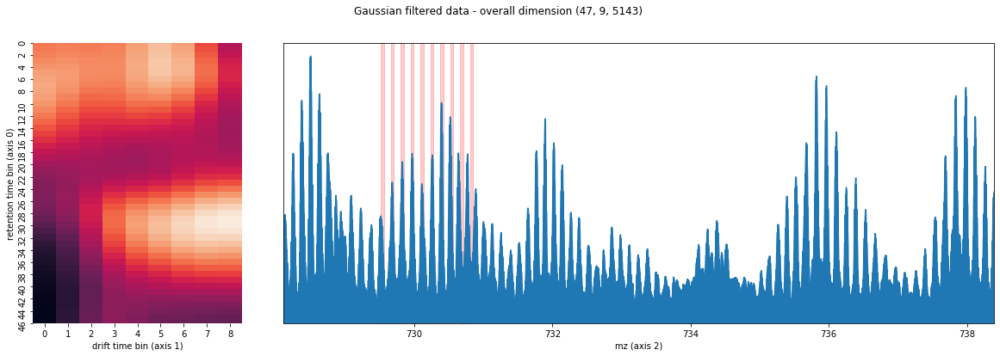

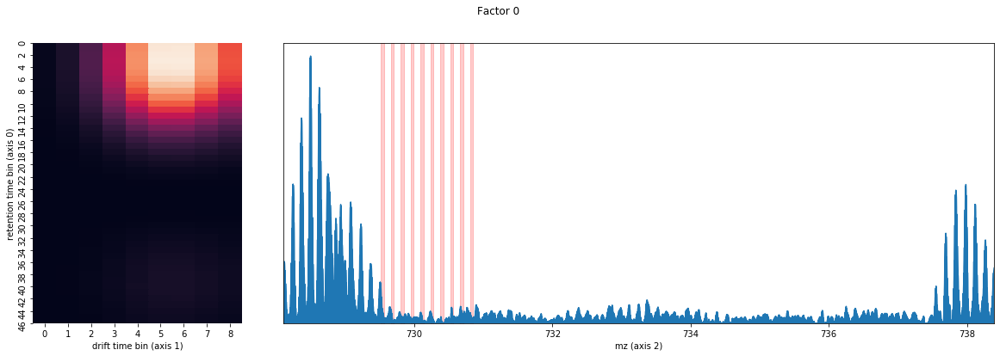

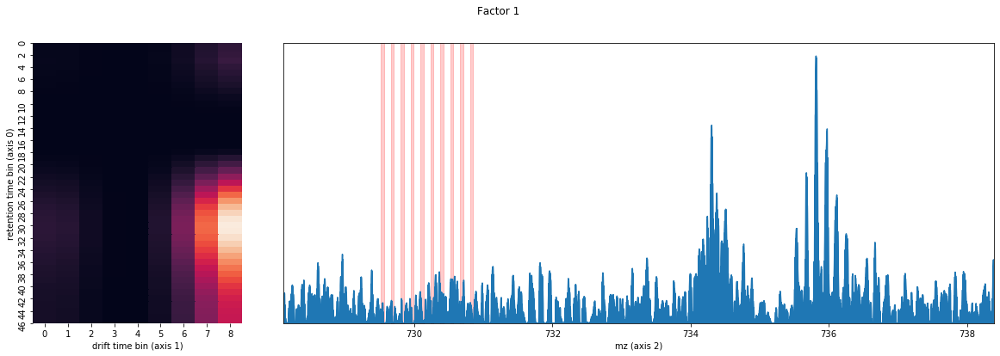

...

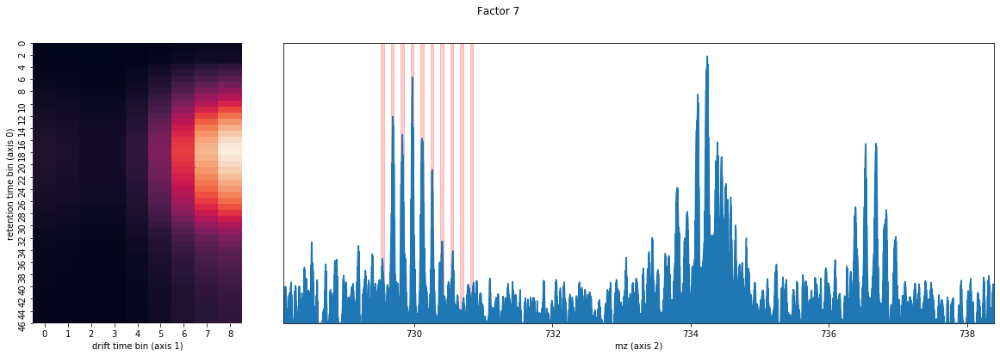

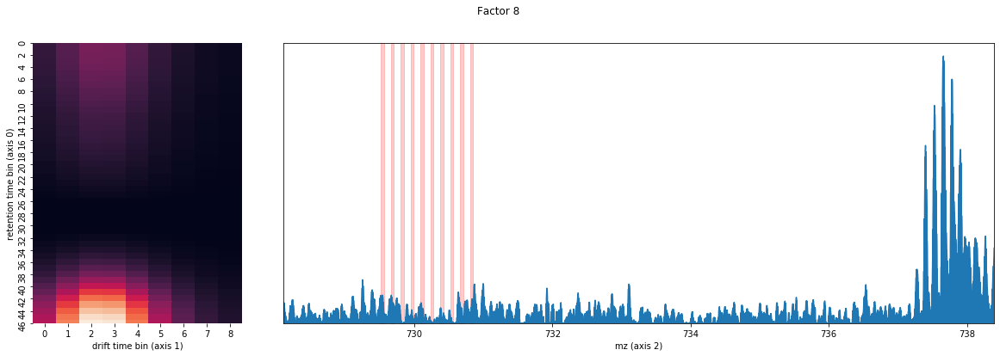

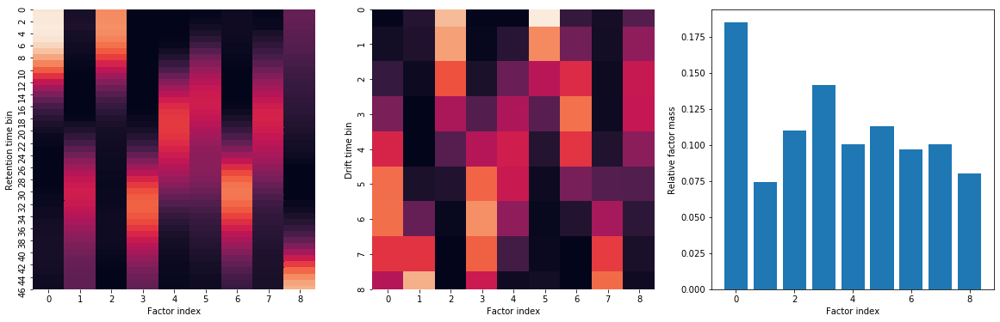

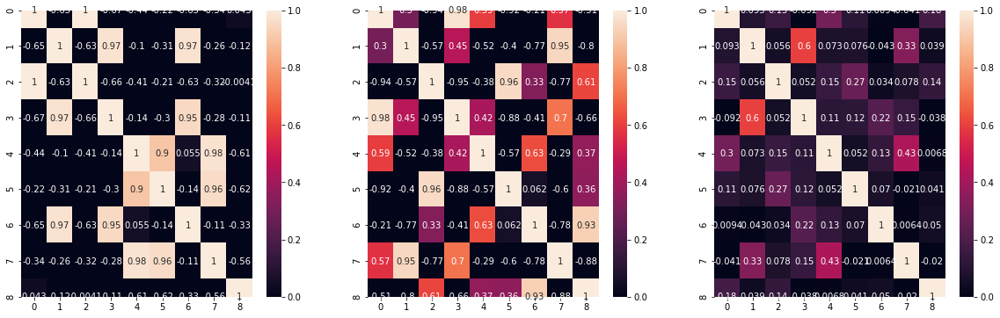

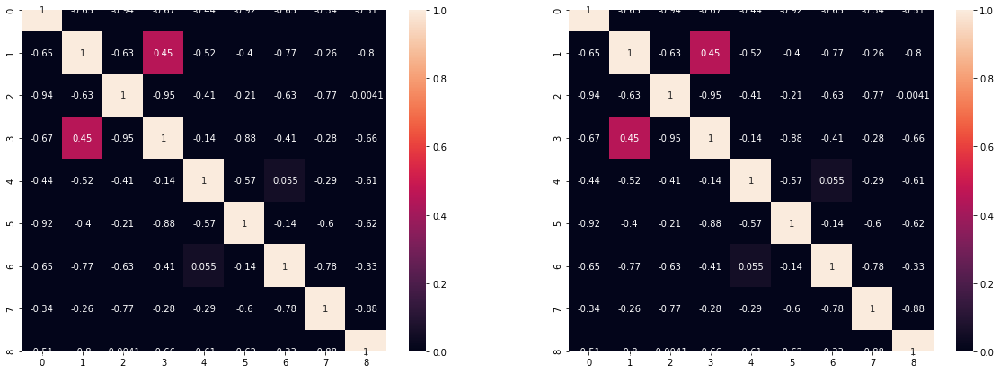

In [25]:
#this example is very challenging, requiring 9 factors to give an OK factorization.
#factor 4 with 9 factors is noticably better than factor 7 with 8 factors
n_factors = 9
i = 6
title = f"{i} {df['name'].values[i]} into {n_factors} factors"
factorize_and_plot(i, n_factors, title)

(47, 9, 5143)
(47, 9, 5140)
(47, 9, 514, 10)
(47, 9, 514)


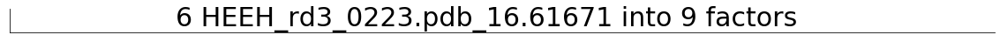

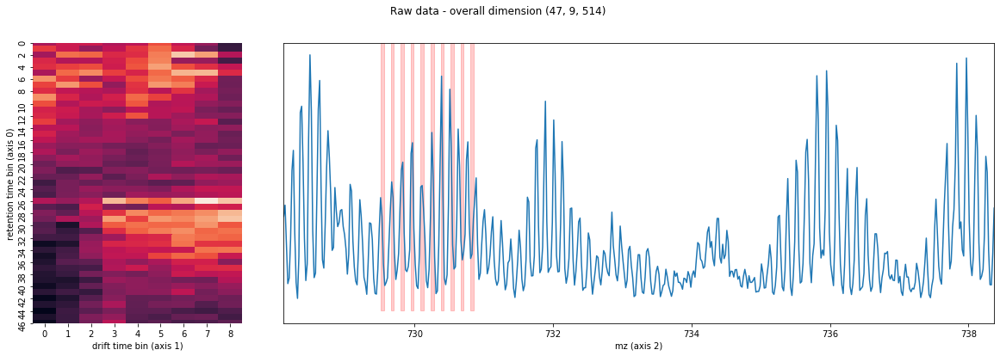

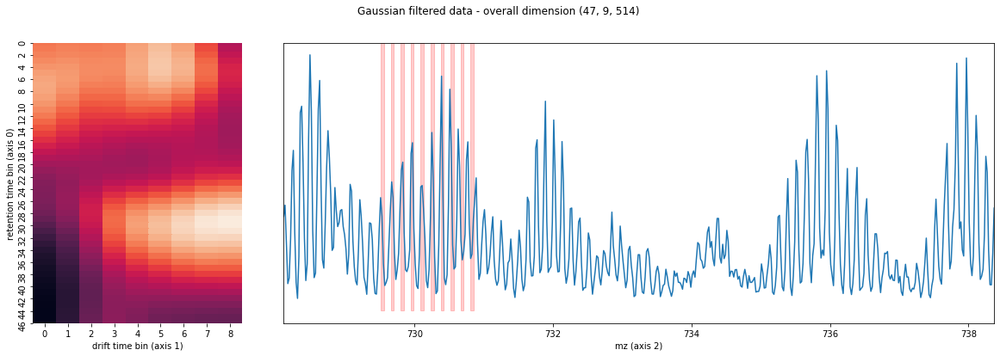

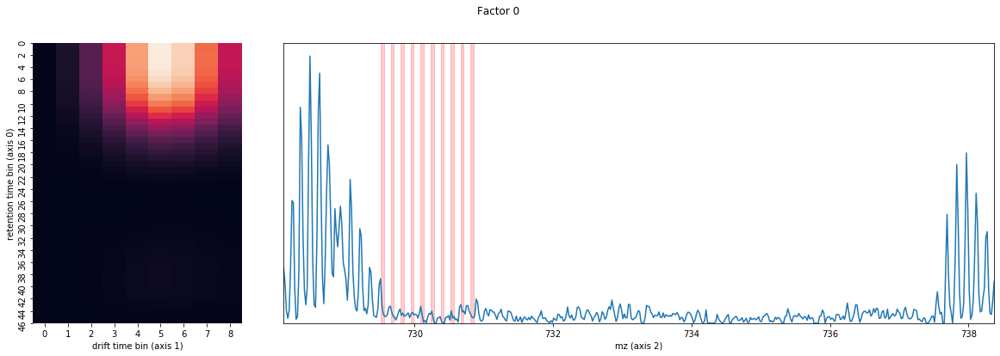

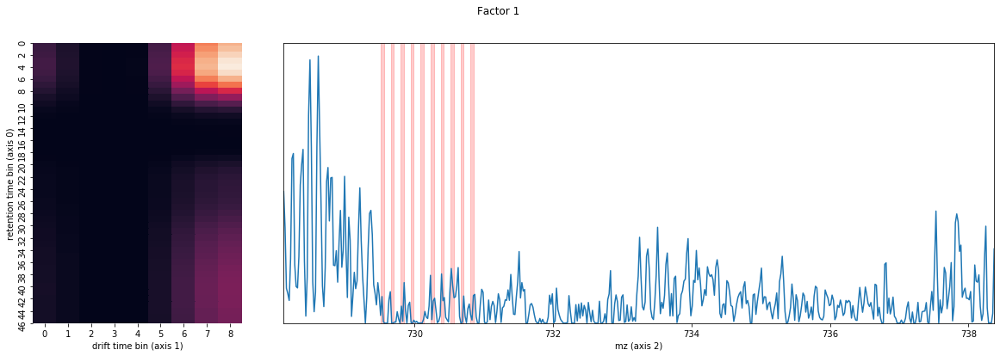

...

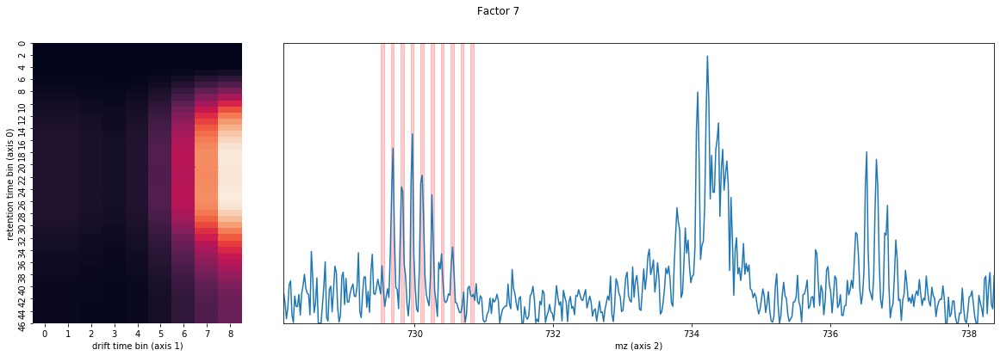

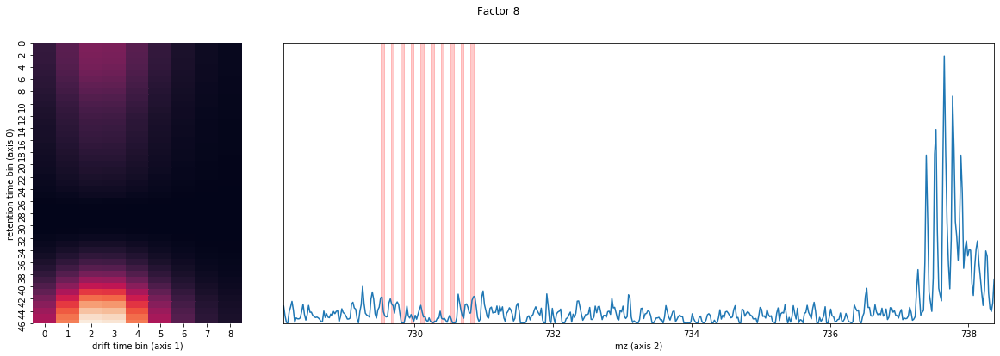

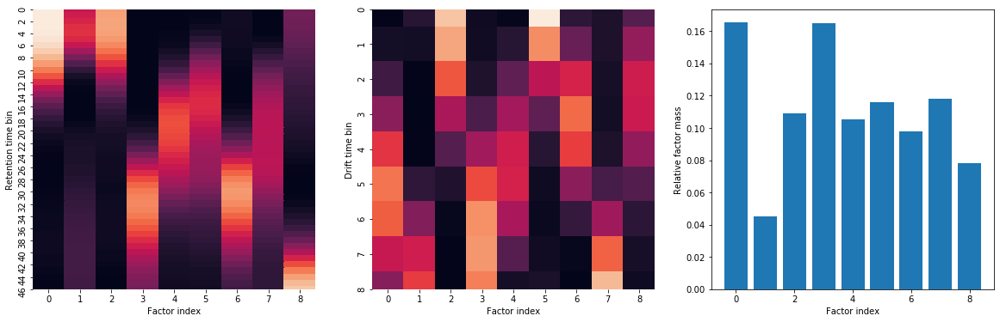

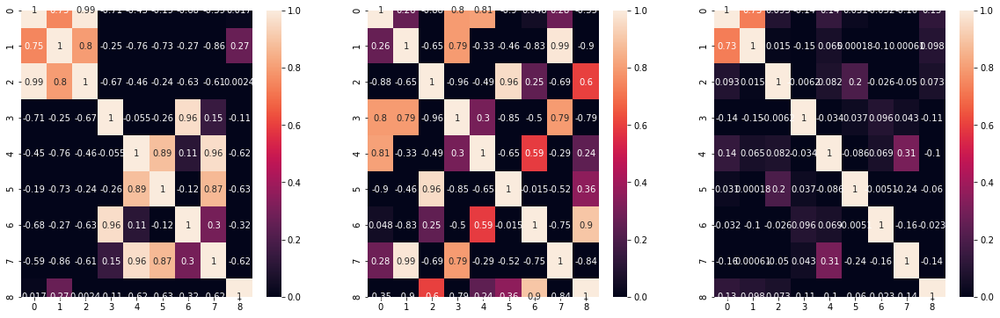

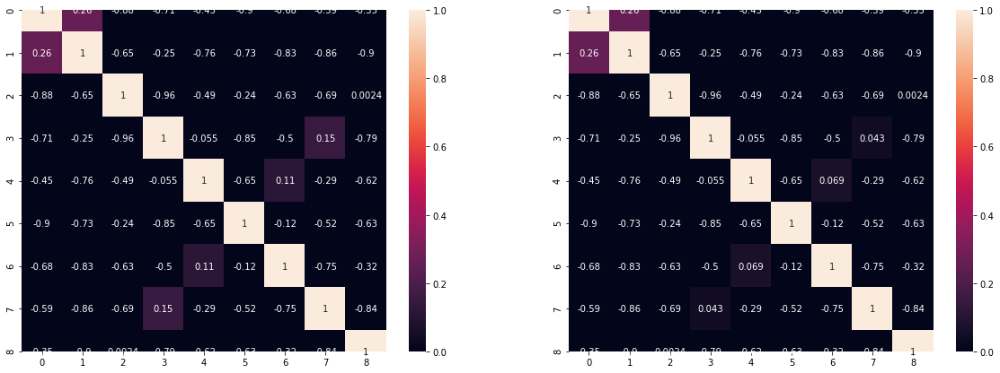

In [26]:
#this example is very challenging, requiring 9 factors to give an OK factorization.
#factor 4 with 9 factors is noticably better than factor 7 with 8 factors
n_factors = 9
i = 6
title = f"{i} {df['name'].values[i]} into {n_factors} factors"
factorize_and_plot(i, n_factors, title,step=10)

(47, 9, 5143)
(47, 9, 5140)
(47, 9, 514, 10)
(47, 9, 514)


/Users/rwl0960/opt/anaconda3/envs/dask_lab/lib/python3.7/site-packages/ipykernel_launcher.py:124: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


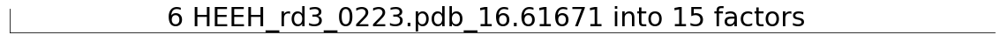

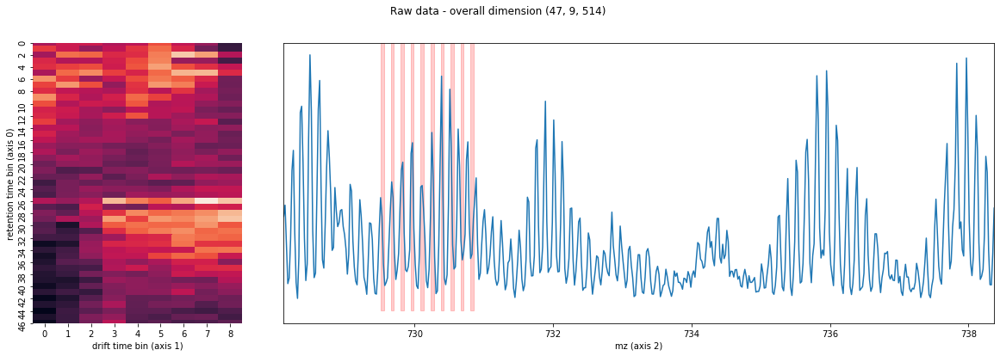

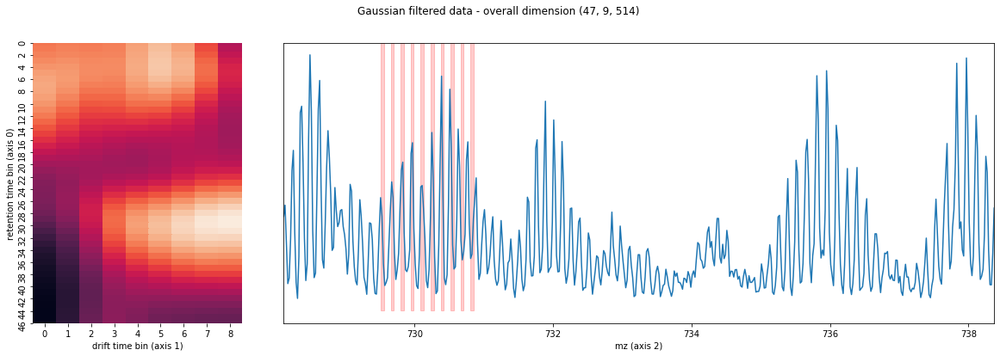

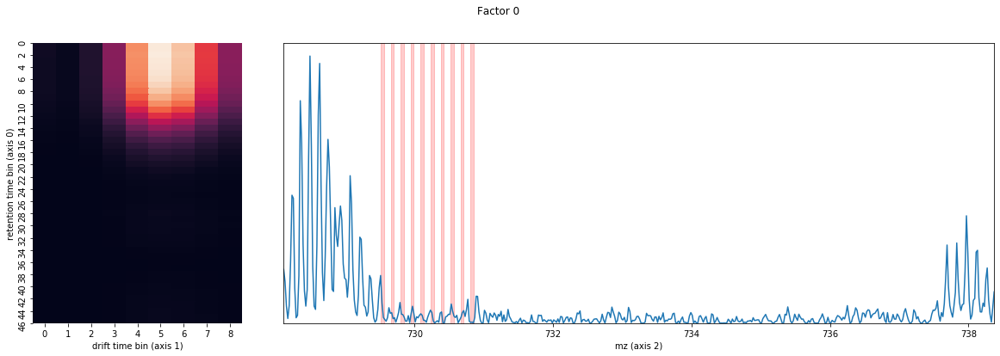

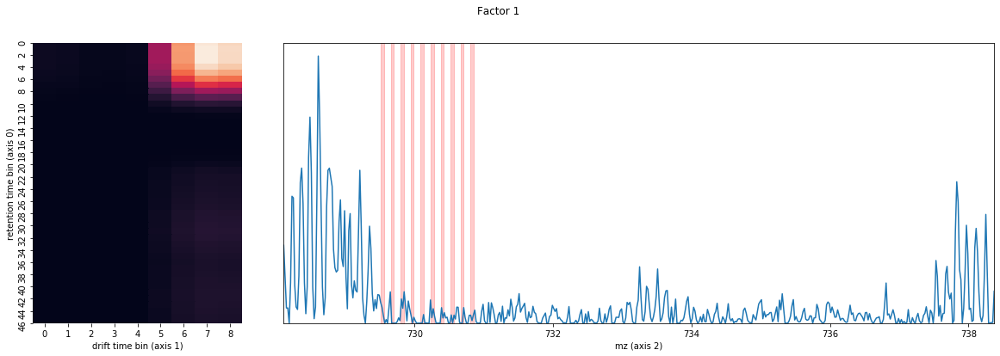

...

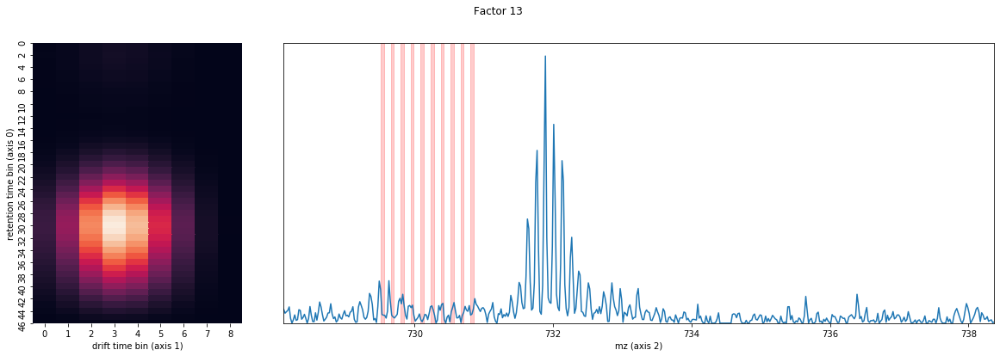

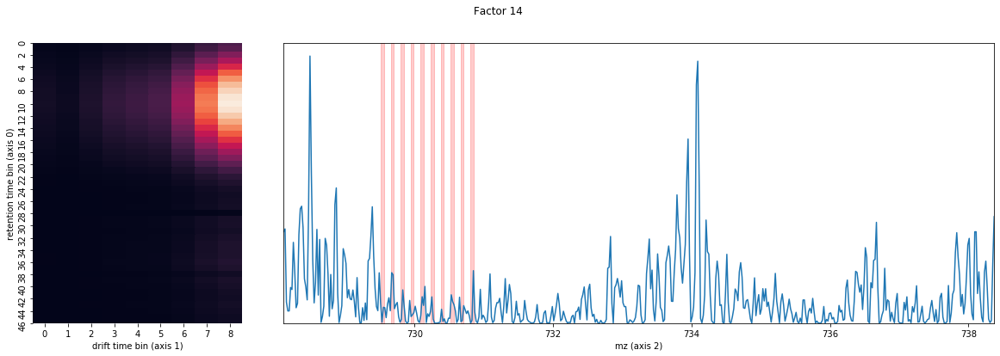

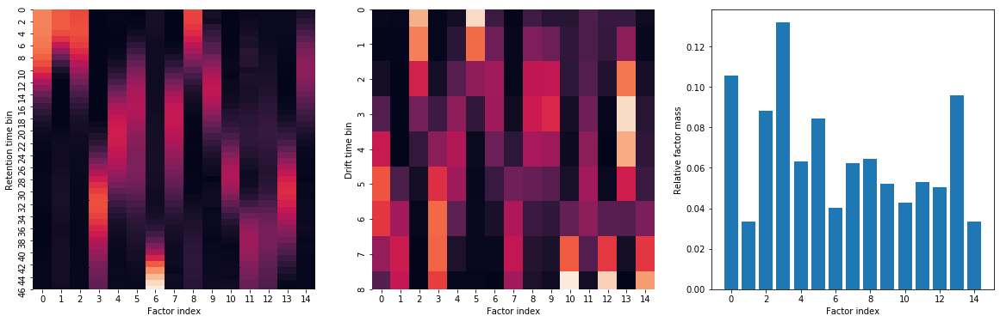

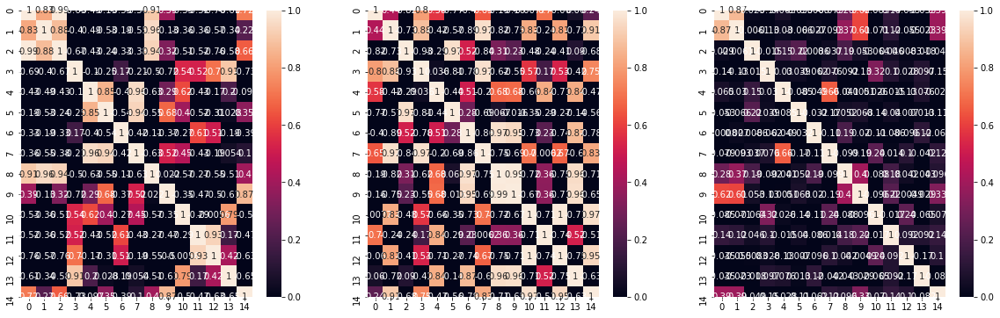

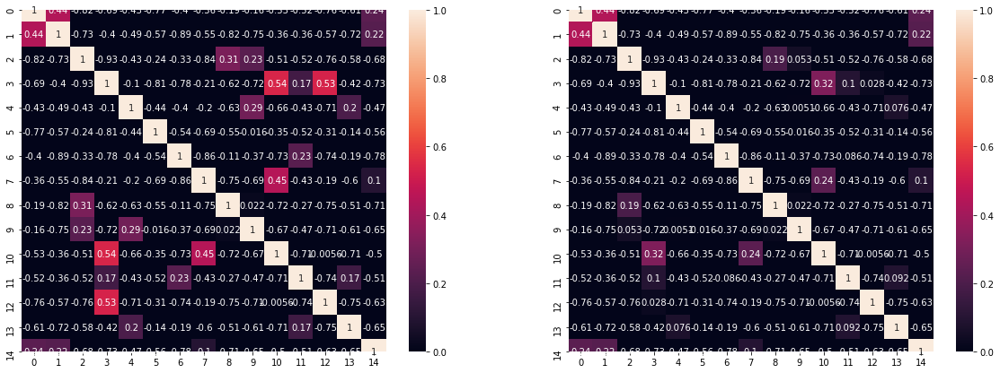

In [27]:
#this example is very challenging, requiring 9 factors to give an OK factorization.
#factor 4 with 9 factors is noticably better than factor 7 with 8 factors
n_factors = 15
i = 6
title = f"{i} {df['name'].values[i]} into {n_factors} factors"
factorize_and_plot(i, n_factors, title,step=10)

(47, 9, 5143)
(47, 9, 5140)
(47, 9, 514, 10)
(47, 9, 514)


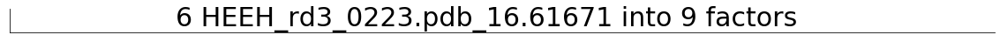

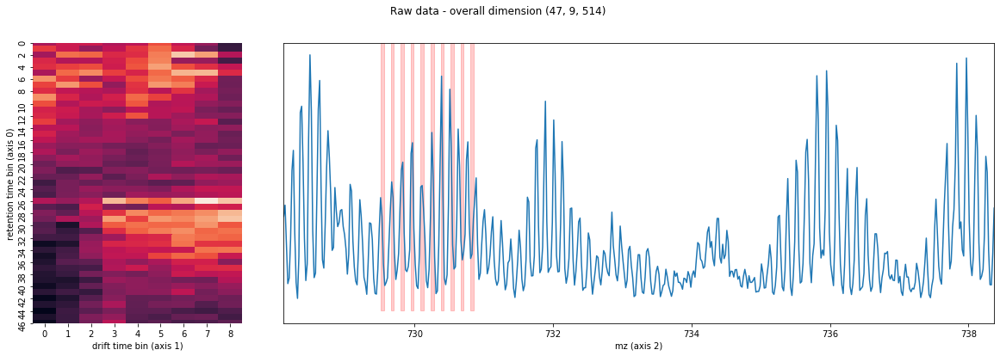

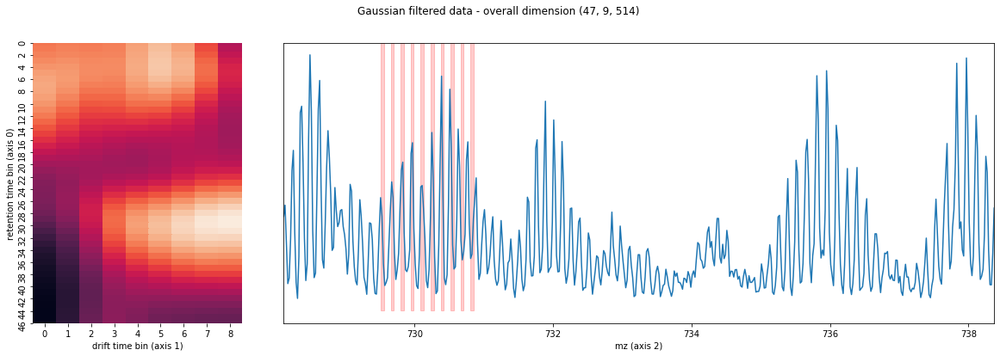

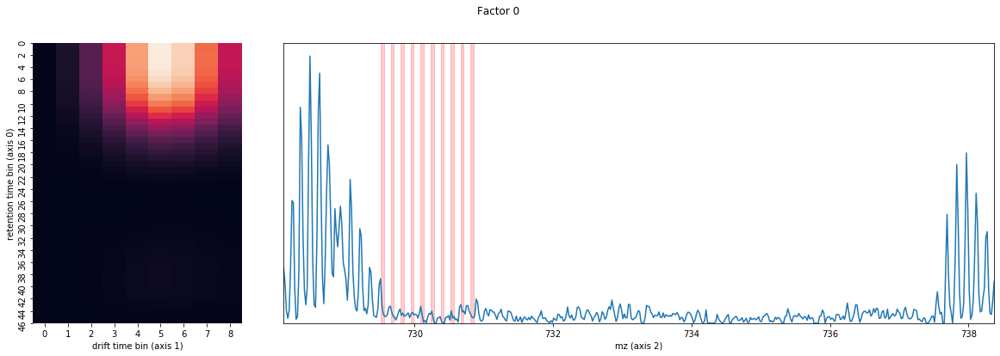

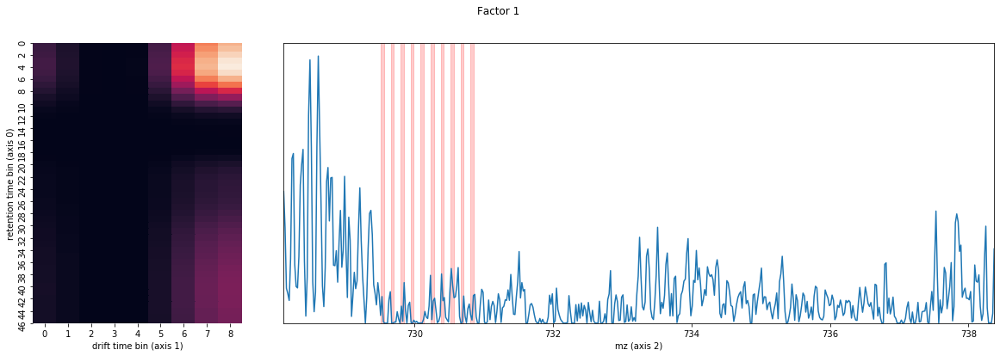

...

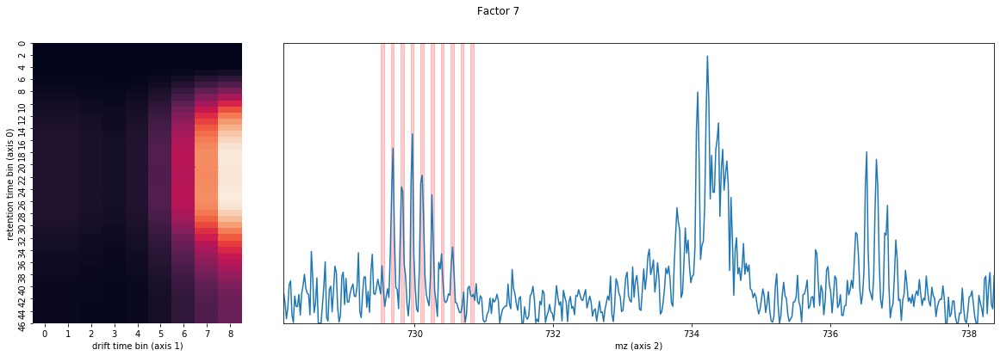

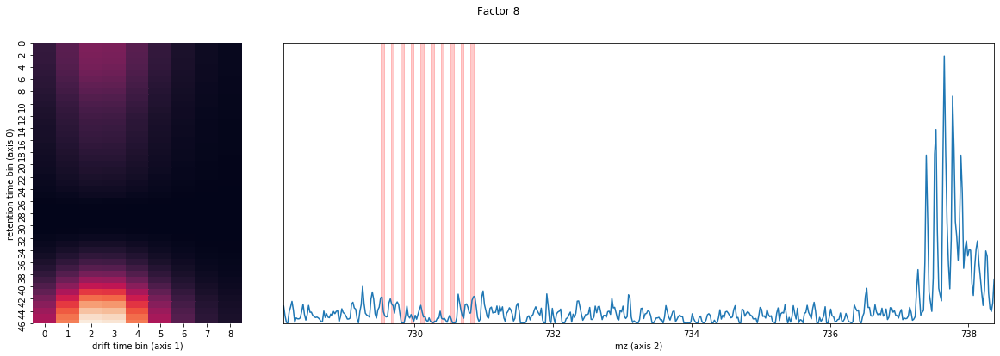

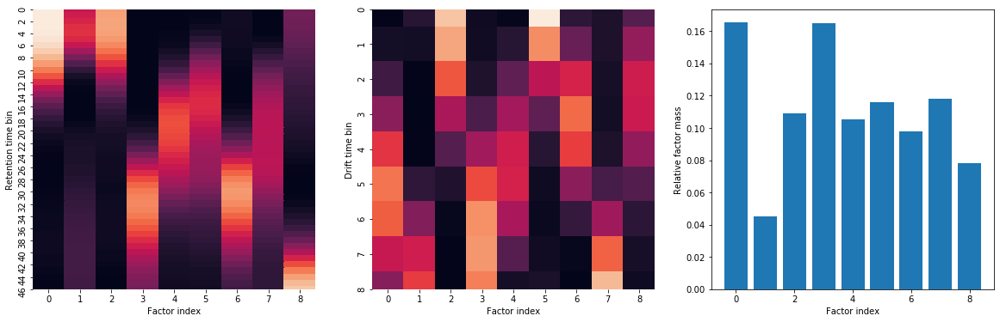

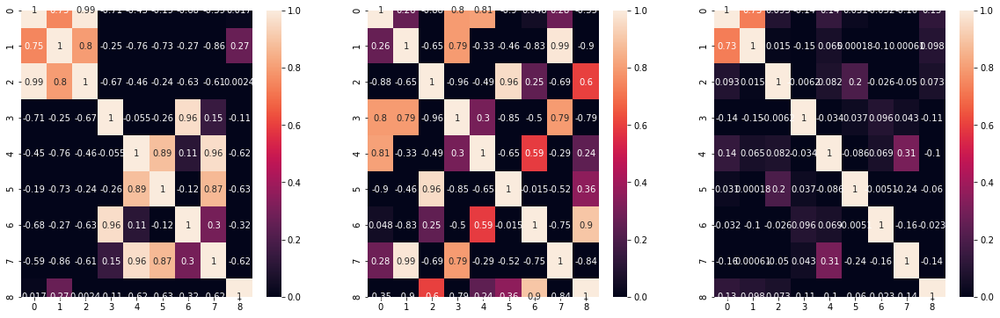

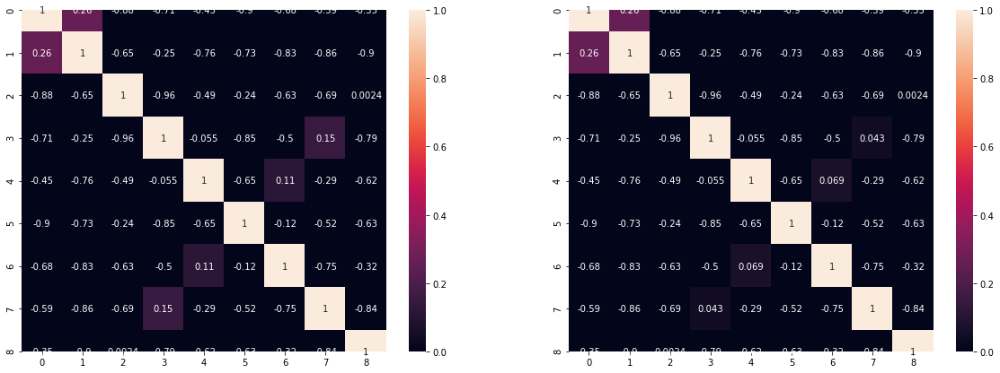

In [28]:
#this example is very challenging, requiring 9 factors to give an OK factorization.
#factor 4 with 9 factors is noticably better than factor 7 with 8 factors
n_factors = 9
i = 6
title = f"{i} {df['name'].values[i]} into {n_factors} factors"
factorize_and_plot(i, n_factors, title,step=10)